In [11]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

In [2]:
import os
import pandas as pd

def process_runs(df):
    """
    Split a single DataFrame of 3×388 rows into run1/run2/run3,
    drop the other-run columns, merge on patient_loc, and compute avg_resp_prob.
    Rows with any missing run data or duplicated patient_loc are removed.
    """
    run_dfs = []
    splits = [(0, 388), (388, 776), (776, 1164)]

    for i, (start, end) in enumerate(splits, start=1):
        sub = df.iloc[start:end].reset_index(drop=True)
        # drop columns for the *other* runs
        to_drop = [
            col for col in sub.columns 
            if any(col.endswith(f"_run{j}") for j in (1, 2, 3) if j != i)
        ]
        sub = sub.drop(columns=to_drop)
        # normalize patient_loc for safe merging
        sub["patient_loc"] = sub["patient_loc"].astype(str).str.strip()
        run_dfs.append(sub)

    # Outer-merge on patient_loc
    merged = run_dfs[0].merge(run_dfs[1], on="patient_loc", how="outer") \
                      .merge(run_dfs[2], on="patient_loc", how="outer")

    # Drop rows with any missing values from the runs
    prob_cols = ["prob_resp_run1", "prob_resp_run2", "prob_resp_run3"]
    merged = merged.dropna(subset=prob_cols)

    # Drop duplicate patient_loc entries
    merged = merged.drop_duplicates(subset="patient_loc", keep=False)

    # Compute average responder probability
    merged["avg_resp_prob"] = merged[prob_cols].mean(axis=1)

    return merged

def load_and_process_sim_data(
    base_dir,
    openhrs,
    aed_main,
    aed_all,
    maxresps,
    opentypes
):
    """
    Load all sim CSVs for:
      – aedYes (cfr in cfrs_main) under base_dir/Data/sim_runs
      – aedall_all_aeds (cfr in cfrs_all) in base_dir
    then apply process_runs() to each and stash in a dict.
    """
    processed = {}
    
    # first the aedYes files in Data/sim_runs
    for openhr in openhrs:
        for cfr in aed_main:
            for maxresp in maxresps:
                for opentype in opentypes:
                    fname = (
                        f"sim_results_openhr{openhr}"
                        f"_cfr{cfr}_maxresp{maxresp}_numsim3_aedYes_-open{opentype}.csv"
                    )
                    path = os.path.join(base_dir, "Data", "sim_runs", fname)
                    if not os.path.exists(path):
                        print(f"⚠️ missing: {path}")
                        continue
                    df = pd.read_csv(path)
                    df_proc = process_runs(df)
                    df_proc["openhr"] = openhr
                    df_proc["cfr"]    = cfr
                    df_proc["aed"]    = "Yes"
                    processed[(openhr, cfr, maxresp, "aedYes", opentype)] = df_proc
    
    # then the aedall_all_aeds files at top level
    for openhr in openhrs:
        for cfr in aed_all:
            fname = (
                f"sim_results_openhr{openhr}"
                f"_cfr{cfr}_maxresp100_numsim3_aedall_all_aeds.csv"
            )
            path = os.path.join(base_dir, fname)
            if not os.path.exists(path):
                print(f"⚠️ missing: {path}")
                continue
            df = pd.read_csv(path)
            df_proc = process_runs(df)
            df_proc["openhr"] = openhr
            df_proc["cfr"]    = cfr
            df_proc["aed"]    = "all"
            processed[(openhr, cfr, "aedall")] = df_proc

    return processed




In [3]:
def process_runs_prelim(df):
    """
    Split a single DataFrame of 3×388 rows into run1/run2/run3,
    drop the other-run columns, merge on patient_loc, and compute avg_resp_prob.
    Rows with any missing run data or duplicated patient_loc are removed.
    """
    run_dfs = []
    splits = [(0, 388), (388, 776), (776, 1164)]

    for i, (start, end) in enumerate(splits, start=1):
        sub = df.iloc[start:end].reset_index(drop=True)
        # drop columns for the *other* runs
        to_drop = [
            col for col in sub.columns 
            if any(col.endswith(f"_run{j}") for j in (1, 2, 3) if j != i)
        ]
        sub = sub.drop(columns=to_drop)
        # normalize patient_loc for safe merging
        sub["patient_loc"] = sub["patient_loc"].astype(str).str.strip()
        run_dfs.append(sub)

    # Outer-merge on patient_loc
    merged = run_dfs[0].merge(run_dfs[1], on="patient_loc", how="outer") \
                      .merge(run_dfs[2], on="patient_loc", how="outer")

    # Drop rows with any missing values from the runs
    prob_cols = ["prob_resp_run1", "prob_resp_run2", "prob_resp_run3"]
    merged = merged.dropna(subset=prob_cols)

    # Drop duplicate patient_loc entries
    merged = merged.drop_duplicates(subset="patient_loc", keep=False)

    # Compute average responder probability
    merged["avg_resp_prob"] = merged[prob_cols].mean(axis=1)

    return merged

def load_and_process_sim_data_prelim(
    base_dir,
    openhrs,
    aed_main,
    aed_all
):
    """
    Load all sim CSVs for:
      – aedYes (cfr in cfrs_main) under base_dir/Data/sim_runs
      – aedall_all_aeds (cfr in cfrs_all) in base_dir
    then apply process_runs() to each and stash in a dict.
    """
    processed = {}
    
    # first the aedYes files in Data/sim_runs
    for openhr in openhrs:
        for cfr in aed_main:
                    fname = (
                        f"sim_results_openhr{openhr}"
                        f"_cfr{cfr}_maxresp100_numsim3_aedYes.csv"
                    )
                    path = os.path.join(base_dir, fname)
                    if not os.path.exists(path):
                        print(f"⚠️ missing: {path}")
                        continue
                    df = pd.read_csv(path)
                    df_proc = process_runs(df)
                    df_proc["openhr"] = openhr
                    df_proc["cfr"]    = cfr
                    df_proc["aed"]    = "Yes"
                    processed[(openhr, cfr, "aedYes")] = df_proc
    
    # then the aedall_all_aeds files at top level
    for openhr in openhrs:
        for cfr in aed_all:
            fname = (
                f"sim_results_openhr{openhr}"
                f"_cfr{cfr}_maxresp100_numsim3_aedall_all_aeds.csv"
            )
            path = os.path.join(base_dir, fname)
            if not os.path.exists(path):
                print(f"⚠️ missing: {path}")
                continue
            df = pd.read_csv(path)
            df_proc = process_runs(df)
            df_proc["openhr"] = openhr
            df_proc["cfr"]    = cfr
            df_proc["aed"]    = "all"
            processed[(openhr, cfr, "aedall")] = df_proc

    return processed

In [5]:
# — Usage example —

openhrs     = [2.0, 8.0, 14.0, 20.0]
cfrs_main   = [0.0025, 0.005, 0.0075, 0.01, 0.0125, 0.015, 0.0175, 0.02, 0.0225, 0.025, 0.0275, 0.03]
cfrs_all    = [0.005]
base_folder = "."#/Archive"   # or wherever your files live
opentypes = ["normal", "247"]
maxresps = [100, 150]

all_data = load_and_process_sim_data(base_folder, openhrs, cfrs_main, cfrs_all, maxresps, opentypes)

# Access one processed DataFrame by its key:
#df_8_0p0175 = all_data[(8.0, 0.0025, "aedYes")]
# Load AED=All simulations

⚠️ missing: .\sim_results_openhr2.0_cfr0.005_maxresp100_numsim3_aedall_all_aeds.csv
⚠️ missing: .\sim_results_openhr8.0_cfr0.005_maxresp100_numsim3_aedall_all_aeds.csv
⚠️ missing: .\sim_results_openhr14.0_cfr0.005_maxresp100_numsim3_aedall_all_aeds.csv
⚠️ missing: .\sim_results_openhr20.0_cfr0.005_maxresp100_numsim3_aedall_all_aeds.csv


In [132]:
all_data

{(2.0,
  0.0025,
  100,
  'aedYes',
  'normal'):                patient_loc                      responder_loc_run1  \
 16   (4.702134, 50.897263)                            No responder   
 17    (4.70586, 50.881605)                            No responder   
 19   (4.657334, 50.861426)  (4.651543645431178, 50.86149040631603)   
 20   (4.712731, 50.879035)                            No responder   
 21   (4.728813, 50.898917)                            No responder   
 ..                     ...                                     ...   
 387  (4.719738, 50.900312)                            No responder   
 388  (4.692054, 50.883744)                            No responder   
 390  (4.676351, 50.870025)  (4.670254394094983, 50.86917001853635)   
 391   (4.71405, 50.873746)                            No responder   
 392  (4.731353, 50.930623)                            No responder   
 
      duration_Responder_run1 Indirect_Responder_loc_run1 aed_loc_run1  \
 16                  100

In [74]:
df_8_0p005 = all_data[(2.0,
  0.005,
  100,
  'aedYes',
  'normal')]

In [68]:
df_8_0p0175

,patient_loc,responder_loc_run1,duration_Responder_run1,Indirect_Responder_loc_run1,aed_loc_run1,duration_AED_run1,vector_loc_run1,duration_Vector_run1,prob_vec_run1,prob_resp_run1,...,prob_resp_run3,filter_values_run3,opening_hour_run3,decline_rate_run3,max_number_responder_run3,proportion_of_CFR_run3,avg_resp_prob,openhr,cfr,aed
0,"(4.724486, 50.875134)","(4.7216475750356315, 50.87416072782372)",167.01,No AED,No AED,10000.00,"(4.7243436, 50.8696549)",641.37,0.324247,0.586207,...,0.548322,Yes,2.0,0.88,100.0,0.0175,0.593988,2.0,0.0175,Yes
1,"(4.663458, 50.872624)","(4.662920929138891, 50.87025338431449)",192.45,No AED,No AED,10000.00,"(4.6658621, 50.8774603)",621.19,0.335943,0.573731,...,0.656392,Yes,2.0,0.88,100.0,0.0175,0.597767,2.0,0.0175,Yes
2,"(4.706287, 50.868107)",No responder,10000.00,No AED,No AED,10000.00,"(4.6998331, 50.8723536)",618.41,0.337587,0.337587,...,0.337587,Yes,2.0,0.88,100.0,0.0175,0.337587,2.0,0.0175,Yes
3,"(4.729334, 50.886379)",No responder,10000.00,No AED,No AED,10000.00,"(4.7243436, 50.8696549)",1978.53,0.030983,0.030983,...,0.030983,Yes,2.0,0.88,100.0,0.0175,0.264419,2.0,0.0175,Yes
4,"(4.7093, 50.870361)","(4.708965112370173, 50.87035495224184)",12.61,"(4.705088843536752, 50.8735999444225)","(4.7061156, 50.8741756)",487.83,"(4.6998331, 50.8723536)",750.80,0.267560,0.768442,...,0.267560,Yes,2.0,0.88,100.0,0.0175,0.434521,2.0,0.0175,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
383,"(4.692054, 50.883744)","(4.692285427120557, 50.883545514066014)",43.30,"(4.696655504303607, 50.88278017152645)","(4.6968454, 50.8824145)",339.69,"(4.6953981, 50.8785355)",612.09,0.341354,0.797320,...,0.803615,Yes,2.0,0.88,100.0,0.0175,0.647430,2.0,0.0175,Yes
384,"(4.676329, 50.867263)",No responder,10000.00,No AED,No AED,10000.00,"(4.6658621, 50.8774603)",1466.98,0.076075,0.076075,...,0.076075,Yes,2.0,0.88,100.0,0.0175,0.076075,2.0,0.0175,Yes
385,"(4.676351, 50.870025)","(4.6762486402555465, 50.86870565944901)",170.32,No AED,No AED,10000.00,"(4.6658621, 50.8774603)",934.56,0.193768,0.503057,...,0.548473,Yes,2.0,0.88,100.0,0.0175,0.553208,2.0,0.0175,Yes
386,"(4.71405, 50.873746)",No responder,10000.00,No AED,No AED,10000.00,"(4.7243436, 50.8696549)",693.89,0.295680,0.295680,...,0.295680,Yes,2.0,0.88,100.0,0.0175,0.295680,2.0,0.0175,Yes


In [72]:
max(df_8_0p0175["avg_resp_prob"])

0.8714691001531989

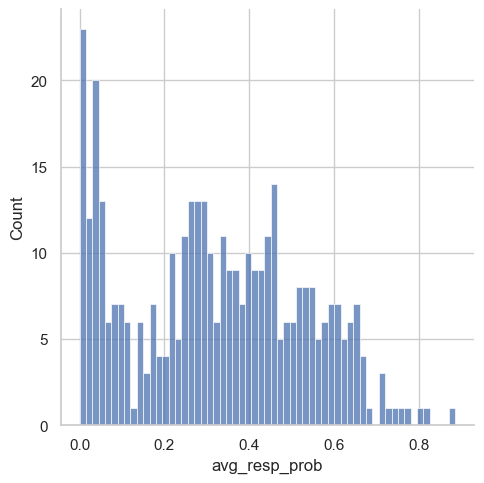

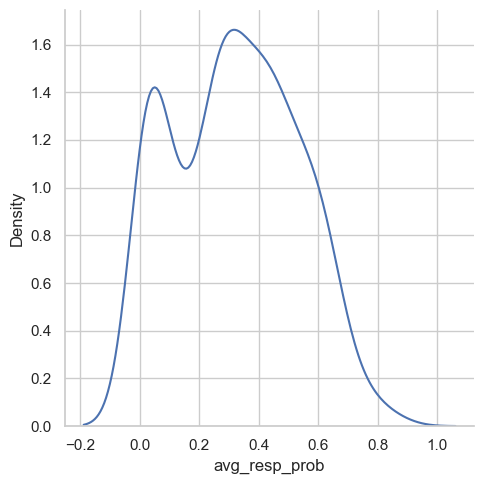

In [82]:
sns.displot(df_8_0p0175, x="avg_resp_prob",binwidth=0.015)
sns.displot(df_8_0p0175, x="avg_resp_prob", kind="kde")

NameError: name 'plot_df' is not defined

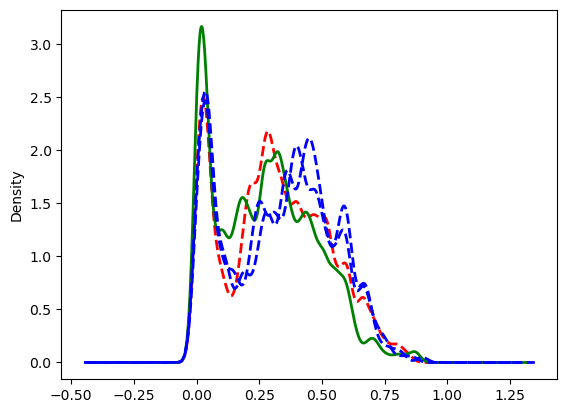

In [12]:
# Plot density for both columns with different styles
df_8_0p005 = all_data[(2.0, 0.005, 100, 'aedYes', 'normal')]
df_8_0p025 = all_data[(2.0, 0.025, 100, 'aedYes', 'normal')]
df_8_0p0125 = all_data[(2.0, 0.0125, 100, 'aedYes', 'normal')]
df_8_0p03 = all_data[(2.0, 0.03, 100, 'aedYes', 'normal')]

df_8_0p0125["avg_resp_prob"].plot.kde(bw_method=0.1, color='red', linestyle='--', linewidth=2, label='Dataset 1')
df_8_0p005['avg_resp_prob'].plot.kde(bw_method=0.1, color='green', linestyle='-', linewidth=2, label='Dataset 2')
df_8_0p025["avg_resp_prob"].plot.kde(bw_method=0.1, color='blue', linestyle='--', linewidth=2, label='Dataset 3')
df_8_0p03["avg_resp_prob"].plot.kde(bw_method=0.1, color='blue', linestyle='--', linewidth=2, label='Dataset 4')

sns.displot(
        data=plot_df,
        x="avg_resp_prob",
        hue="Scenario",
        fill=True,
        binwidth=0.015,
    )

plt.title('Customized Density Plot Comparison')
plt.legend()
plt.show()

In [40]:
df_8_0p005 = all_data[(2.0, 0.005, 100, 'aedYes', 'normal')]
df_8_0p025 = all_data[(2.0, 0.025, 100, 'aedYes', 'normal')]
df_8_0p0125 = all_data[(2.0, 0.0125, 100, 'aedYes', 'normal')]
df_8_0p03 = all_data[(2.0, 0.03, 100, 'aedYes', 'normal')]

In [ ]:
df_8_0p0125

In [13]:
def density_plot_seaborn(time, prop, maxresponder, aed_style, opentypes, all_data, colors):
    sns.set_theme(style="whitegrid")
    plt.figure(figsize=(15, 6))

    cmap = plt.colormaps["Greens"]
    total_lines = len(time) * len(maxresponder) * len(opentypes) * len(prop)
    if colors:
        colors = colors
    else:
        colors = [cmap(0.4 + 0.6 * (i / max(1, total_lines - 1))) for i in range(total_lines)]

    color_idx = 0

    for i in time:
        for maxresp in maxresponder:
            for opentype in opentypes:
                for j in prop:
                    key = (i, j, maxresp, aed_style, opentype)
                    if key not in all_data:
                        print(f"⚠️ Missing key: {key}")
                        continue

                    df = all_data[key]
                    label = f'Time: {i}h, MaxResp: {maxresp}, Open: {opentype}, Prop: {j}'
                    sns.kdeplot(
                        data=df,
                        x="avg_resp_prob",
                        bw_method=0.05,
                        label=label,
                        color=colors[color_idx],
                        fill=True,  # optional, for shaded KDE
                        common_norm=False,
                        linewidth = 2.5
                    )
                    color_idx += 1

    plt.xlabel("Average Survival Probability", fontsize=12)
    plt.ylabel("Density", fontsize=12)
    plt.title("Density of Survival Probabilities across Scenarios", fontsize=14)
    plt.xlim(0, 1)
    plt.legend(title="Scenario", fontsize=10, title_fontsize=11, loc='upper right')
    plt.tight_layout(rect=[0, 0, 0.75, 1])
    plt.grid(True)
    plt.show()

In [14]:
def density_displot_seaborn(time, prop, maxresponder, aed_style, opentypes, all_data):
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt

    sns.set_theme(style="whitegrid")

    records = []

    # Gather all avg_resp_prob values with scenario metadata
    for i in time:
        for maxresp in maxresponder:
            for opentype in opentypes:
                for j in prop:
                    key = (i, j, maxresp, aed_style, opentype)
                    if key not in all_data:
                        print(f"⚠️ Missing key: {key}")
                        continue

                    df = all_data[key]
                    if df.empty or "avg_resp_prob" not in df:
                        continue

                    valid_probs = df["avg_resp_prob"]
                    valid_probs = valid_probs[valid_probs >= 0]

                    for val in valid_probs:
                        records.append({
                            "avg_resp_prob": val,
                            "Time": f"{i}h",
                            "Prop": j,
                            "MaxResp": maxresp,
                            "OpenType": opentype,
                            "Scenario": f'Time: {i}h, MaxResp: {maxresp}, Open: {opentype}, Prop: {j}'
                        })

    if not records:
        print("❌ No valid data to plot.")
        return

    plot_df = pd.DataFrame(records)

    # Displot: grid of KDEs
    g = sns.displot(
        data=plot_df,
        x="avg_resp_prob",
        hue="Scenario",
        fill=True,
        binwidth=0.015,
    )

    g.set_axis_labels("Average Survival Probability", "Density")
    g.fig.suptitle("Density of Survival Probabilities (bw=0.15)", fontsize=14)
    plt.tight_layout()
    plt.show()

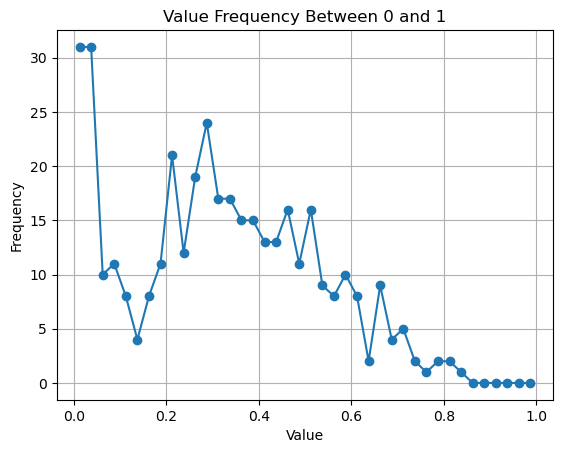

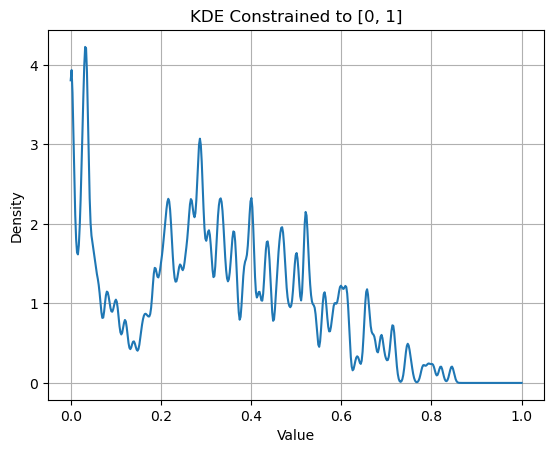

In [9]:
from statsmodels.nonparametric.kde import KDEUnivariate

counts, bins = np.histogram(df_8_0p0125["avg_resp_prob"], bins=40, range=(0, 1))
bin_centers = (bins[:-1] + bins[1:]) / 2

plt.plot(bin_centers, counts, marker='o')
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.title("Value Frequency Between 0 and 1")
plt.grid(True)
plt.show()

kde = KDEUnivariate(df_8_0p0125["avg_resp_prob"])
kde.fit(bw=0.005, fft=False, cut=0, clip=(0, 1))  # clip ensures bounds

x = np.linspace(0, 1, 500)
y = kde.evaluate(x)

plt.plot(x, y)
plt.xlabel("Value")
plt.ylabel("Density")
plt.title("KDE Constrained to [0, 1]")
plt.grid(True)
plt.show()

c:\Users\leonw\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\leonw\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\leonw\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\leonw\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

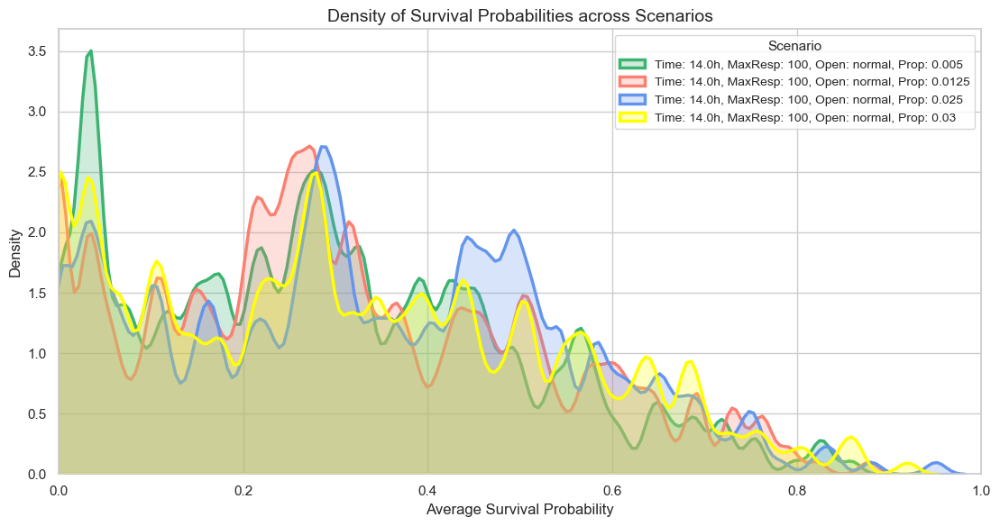

c:\Users\leonw\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


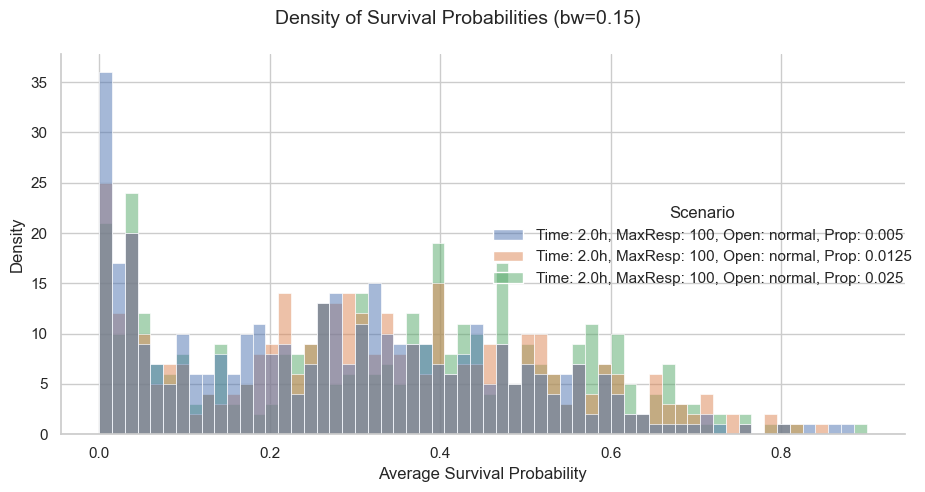

In [16]:
density_plot_seaborn([14.0], [0.005, 0.0125, 0.025, 0.03],[100], "aedYes", ["normal"], all_data,["mediumseagreen", "salmon", "cornflowerblue", "yellow"])
density_displot_seaborn([2.0], [0.005, 0.0125, 0.025],[100], "aedYes", ["normal"], all_data)

In [ ]:
df = pd.DataFrame({
    'A': np.random.randn(1000),
    'B': np.random.randn(1000) + 2,
    'C': np.random.randn(1000) - 2
})

# Plot density for all columns
df.plot.density(bw_method='silverman', figsize=(10, 6))

plt.title('Density Plot for Multiple Columns')
plt.show()

In [17]:
def line_plot_prelim(time, prop, maxresponder, aed_style, all_data):
    plt.figure(figsize=(15, 6))  # Make room for external legend

    for i in time:
        for maxresp in maxresponder:
            for opentype in opentypes:
                x_vals = []
                y_vals = []

                for j in prop:
                    key = (i, j, maxresp, aed_style, opentype)
                    if key not in all_data:
                        print(f"⚠️ Missing key: {key}")
                        continue
                    df = all_data[key]
                    mean = df["avg_resp_prob"].mean()
                    proportion = df["proportion_of_CFR_run1"].mean()
                    x_vals.append(proportion)
                    y_vals.append(mean)

                label = f'Time: {i}h, MaxResp: {maxresp}, Open: {opentype}'
                plt.plot(x_vals, y_vals, linestyle='-', marker='o', label=label)

    plt.xlabel("Proportion of CFRs")
    plt.ylabel("Average Survival Probability")
    plt.title("Line Plot of Mean vs Proportion")

    # Put legend outside the plot on the right
    plt.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), borderaxespad=0.)
    plt.grid(True)
    plt.tight_layout(rect=[0, 0, 0.75, 1])  # leave space on the right
    plt.show()

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np


def line_plot_seaborn(time, prop, maxresponder, aed_style, opentypes, all_data):
    sns.set_theme(style="whitegrid")
    plt.figure(figsize=(15, 6))

    cmap = plt.colormaps["Greens"]
    total_lines = len(time) * len(maxresponder) * len(opentypes)
    colors = [cmap(0.4 + 0.6 * (i / max(1, total_lines - 1))) for i in range(total_lines)]

    color_idx = 0

    for i in time:
        for maxresp in maxresponder:
            for opentype in opentypes:
                x_vals = []
                y_vals = []

                for j in prop:
                    key = (i, j, maxresp, aed_style, opentype)
                    if key not in all_data:
                        print(f"⚠️ Missing key: {key}")
                        continue
                    df = all_data[key]
                    mean = df["avg_resp_prob"].mean()
                    proportion = df["proportion_of_CFR_run1"].mean()
                    x_vals.append(proportion)
                    y_vals.append(mean)

                label = f'Time: {i}h, MaxResp: {maxresp}, Open: {opentype}'
                sns.lineplot(x=x_vals, y=y_vals, label=label, marker='o', color=colors[color_idx])
                color_idx += 1

    plt.xlabel("Proportion of CFRs", fontsize=12)
    plt.ylabel("Average Survival Probability", fontsize=12)
    plt.title("Average Survival Probability vs CFR Proportion", fontsize=14)
    plt.legend(title="Scenario", fontsize=10, title_fontsize=11, loc='center left', bbox_to_anchor=(1.02, 0.5))
    plt.tight_layout(rect=[0, 0, 0.75, 1])
    plt.grid(True)
    plt.show()

In [19]:
def filtered_columnwise_stats(df, duration_columns, threshold=10000):
    stats = {}
    for col in duration_columns:
        filtered = df[df[col] < threshold][col]
        stats[col] = filtered.describe()
    return pd.DataFrame(stats)

In [20]:

duration_columns = [
    "duration_Vector_run1",
    "duration_Responder_run1",
    "duration_Responder_run2",
    "duration_Responder_run3",
    "duration_AED_run1",
    "duration_AED_run2",
    "duration_AED_run3"
]

prop_values = [0.0025, 0.005, 0.0075, 0.01, 0.0125, 0.015, 0.0175, 0.02, 0.0225, 0.025, 0.0275, 0.03]
hour = [2.0, 8.0, 14.0, 20.0]
style = 'aedYes'
maxresp = 100
opentype = 'normal'

with pd.ExcelWriter("C:/Users/leonw/OneDrive - KU Leuven/4th semester/Statistical Consulting/Visualizations/duration_stats_summary.xlsx") as writer:
    for h in hour:
        for prop in prop_values:
            key = (h, prop, maxresp, style, opentype)
            if key in all_data:
                df = all_data[key]
                stats = filtered_columnwise_stats(df, duration_columns)
                sheet_name = f"prop_{str(prop).replace('.', 'p')}"
                stats.to_excel(writer, sheet_name=sheet_name)
                print(f"✅ Added sheet: {sheet_name}")
            else:
                print(f"⚠️ Key missing: {key}")

✅ Added sheet: prop_0p0025
✅ Added sheet: prop_0p005
✅ Added sheet: prop_0p0075
✅ Added sheet: prop_0p01
✅ Added sheet: prop_0p0125
✅ Added sheet: prop_0p015
✅ Added sheet: prop_0p0175
✅ Added sheet: prop_0p02
✅ Added sheet: prop_0p0225
✅ Added sheet: prop_0p025
✅ Added sheet: prop_0p0275
✅ Added sheet: prop_0p03
✅ Added sheet: prop_0p0025
✅ Added sheet: prop_0p005
✅ Added sheet: prop_0p0075
✅ Added sheet: prop_0p01
✅ Added sheet: prop_0p0125
✅ Added sheet: prop_0p015
✅ Added sheet: prop_0p0175
✅ Added sheet: prop_0p02
✅ Added sheet: prop_0p0225
✅ Added sheet: prop_0p025
✅ Added sheet: prop_0p0275
✅ Added sheet: prop_0p03
✅ Added sheet: prop_0p0025
✅ Added sheet: prop_0p005
✅ Added sheet: prop_0p0075
✅ Added sheet: prop_0p01
✅ Added sheet: prop_0p0125
✅ Added sheet: prop_0p015
✅ Added sheet: prop_0p0175
✅ Added sheet: prop_0p02
✅ Added sheet: prop_0p0225
✅ Added sheet: prop_0p025
✅ Added sheet: prop_0p0275
✅ Added sheet: prop_0p03
✅ Added sheet: prop_0p0025
✅ Added sheet: prop_0p005
✅ 

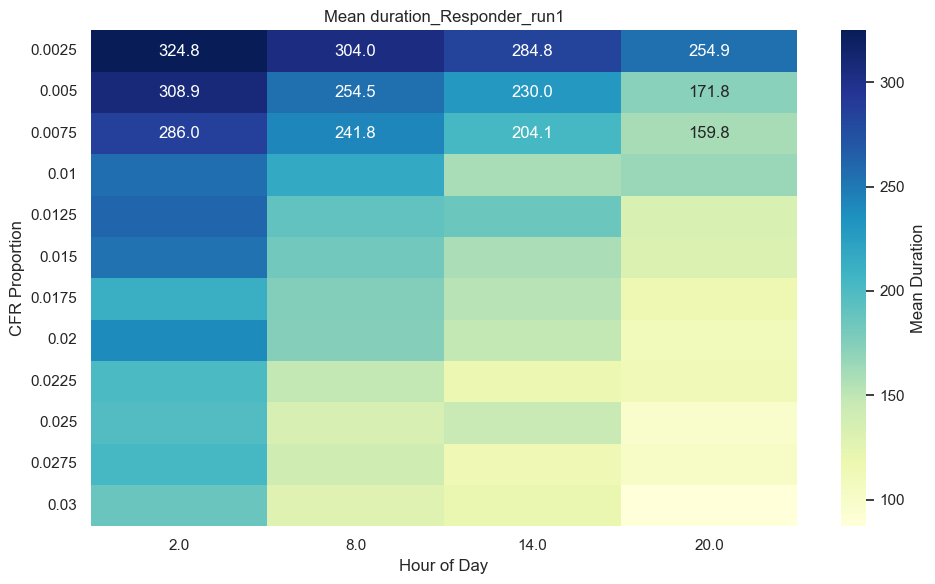

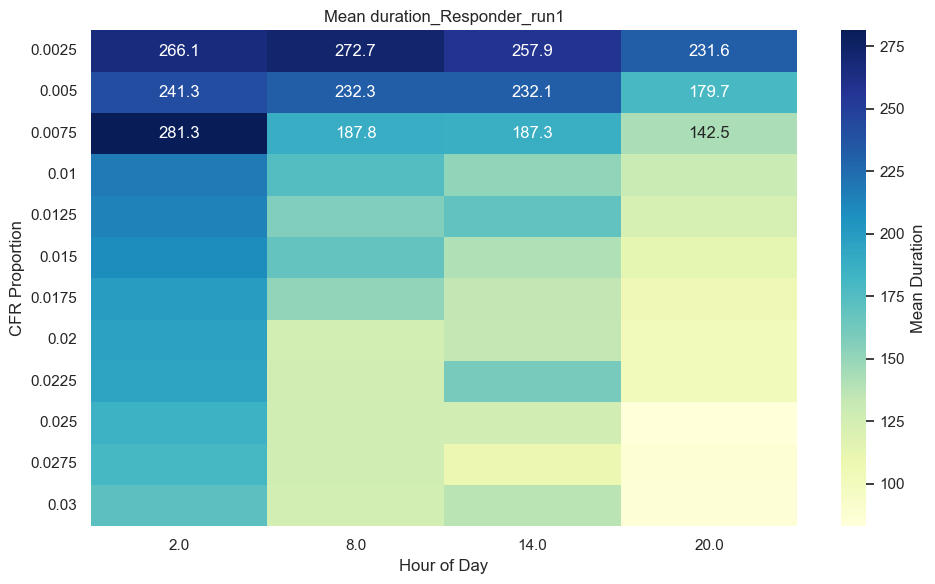

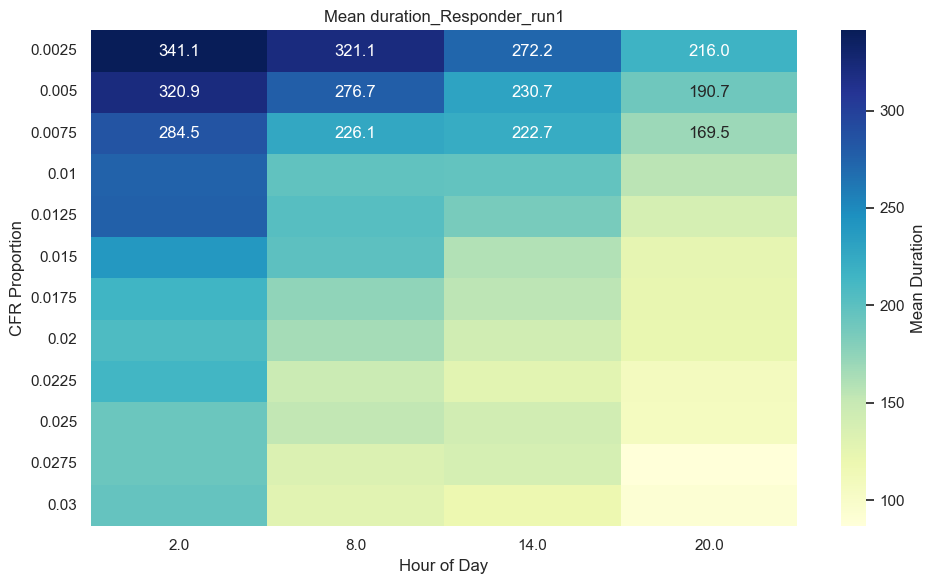

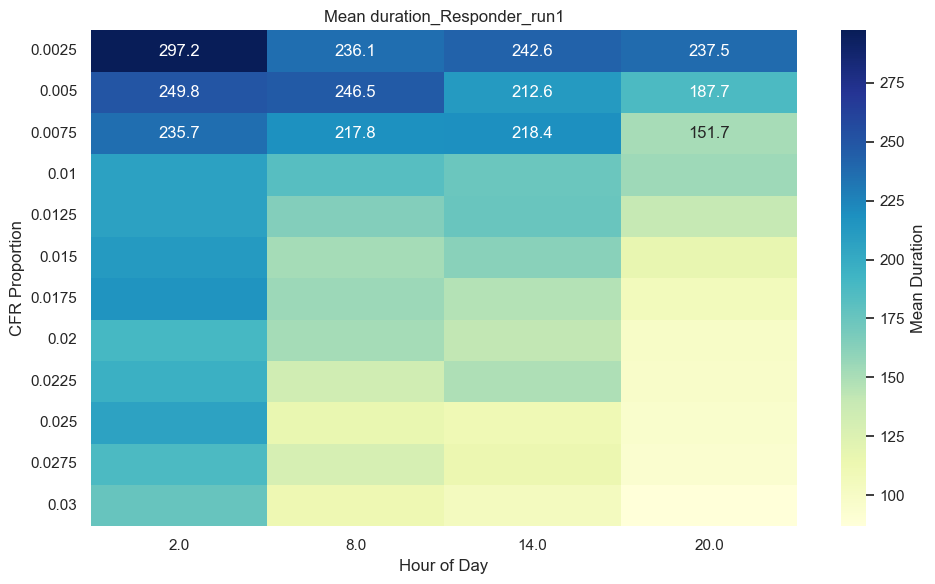

In [72]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Setup
duration_column = "duration_Responder_run1"
threshold = 10000
prop_values = [0.0025, 0.005, 0.0075, 0.01, 0.0125, 0.015, 0.0175, 0.02, 0.0225, 0.025, 0.0275, 0.03]
hours = [2.0, 8.0, 14.0, 20.0]
style = 'aedYes'
maxresps = [100, 150]
opentypes = ['normal', "247"]

# Prepare heatmap data
heatmap_data = pd.DataFrame(index=prop_values, columns=hours)
for maxresp in maxresps:
    for opentype in opentypes:
        for h in hours:
            for prop in prop_values:
                key = (h, prop, maxresp, style, opentype)
                if key in all_data:
                    df = all_data[key]
                    filtered = df[df[duration_column] < threshold][duration_column]
                    heatmap_data.loc[prop, h] = filtered.mean()
                else:
                    print(f"⚠️ Missing key: {key}")
                    heatmap_data.loc[prop, h] = None  # Or np.nan

        # Plot heatmap
        plt.figure(figsize=(10, 6))
        sns.heatmap(heatmap_data.astype(float), annot=True, fmt=".1f", cmap="YlGnBu", cbar_kws={'label': 'Mean Duration'})
        plt.title(f"Mean {duration_column}")
        plt.xlabel("Hour of Day")
        plt.ylabel("CFR Proportion")
        plt.tight_layout()
        plt.savefig(f'C:/Users/leonw/OneDrive - KU Leuven/4th semester/Statistical Consulting/Visualizations/heatmap_duration_{duration_column}_{h}_prop{prop}_style{style}_maxresp_{maxresp}_opentype_{opentype}.png')

In [129]:
def line_plot_seaborn(time, prop, maxresponder, aed_style, opentypes, all_data):
    import seaborn as sns
    import matplotlib.pyplot as plt
    import numpy as np

    sns.set_theme(style="whitegrid")
    plt.figure(figsize=(15, 6))

    # Define separate colormaps for each opentype
    colormaps = {
        opentypes[0]: plt.colormaps["Greens"],
        #opentypes[1]: plt.colormaps["Blues"]
    }

    # Count total lines per opentype for proper color interpolation
    lines_per_opentype = {op: len(time) * len(maxresponder) for op in opentypes}
    color_indices = {op: 0 for op in opentypes}

    # Collect all prob_vec_run1 values to compute the global baseline
    baseline_values = []

    for i in time:
        for maxresp in maxresponder:
            for opentype in opentypes:
                for j in prop:
                    key = (i, j, maxresp, aed_style, opentype)
                    if key in all_data:
                        df = all_data[key]
                        if "prob_vec_run1" in df.columns:
                            baseline_values.extend(df["prob_vec_run1"].dropna().tolist())

    if baseline_values:
        baseline_mean = np.mean(baseline_values)
        plt.axhline(y=baseline_mean, color='red', linestyle='--', linewidth=2, label='Baseline survival vectors')

    # Plot lines
    for i in time:
        for maxresp in maxresponder:
            for opentype in opentypes:
                cmap = colormaps[opentype]
                total = lines_per_opentype[opentype]
                idx = color_indices[opentype]
                color = cmap(0.4 + 0.6 * (idx / max(1, total - 1)))
                color_indices[opentype] += 1

                x_vals = []
                y_vals = []

                for j in prop:
                    key = (i, j, maxresp, aed_style, opentype)
                    if key not in all_data:
                        print(f"⚠️ Missing key: {key}")
                        continue
                    df = all_data[key]
                    mean = df["avg_resp_prob"].mean()
                    proportion = df["proportion_of_CFR_run1"].mean()
                    x_vals.append(proportion)
                    y_vals.append(mean)

                label = f'Time: {i}h, MaxResp: {maxresp}, Open: {opentype}'
                sns.lineplot(x=x_vals, y=y_vals, label=label, marker='o', color=color)

    plt.xlabel("Proportion of CFRs", fontsize=12)
    plt.ylabel("Average Survival Probability", fontsize=12)
    plt.ylim(0.16, 0.44)
    plt.title("Average Survival Probability vs CFR Proportion", fontsize=14)
    plt.legend(title="Scenario", fontsize=10, title_fontsize=11, loc='center left', bbox_to_anchor=(1.02, 0.5))
    plt.tight_layout(rect=[0, 0, 0.75, 1])
    plt.grid(True)
    plt.savefig(f'C:/Users/leonw/OneDrive - KU Leuven/4th semester/Statistical Consulting/Visualizations/line_plot_with_baseline_{hour}_prop{prop}_style{style}_maxresp_{maxresponder}_opentype_{opentypes}.png')

c:\Users\leonw\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\leonw\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\leonw\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\leonw\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

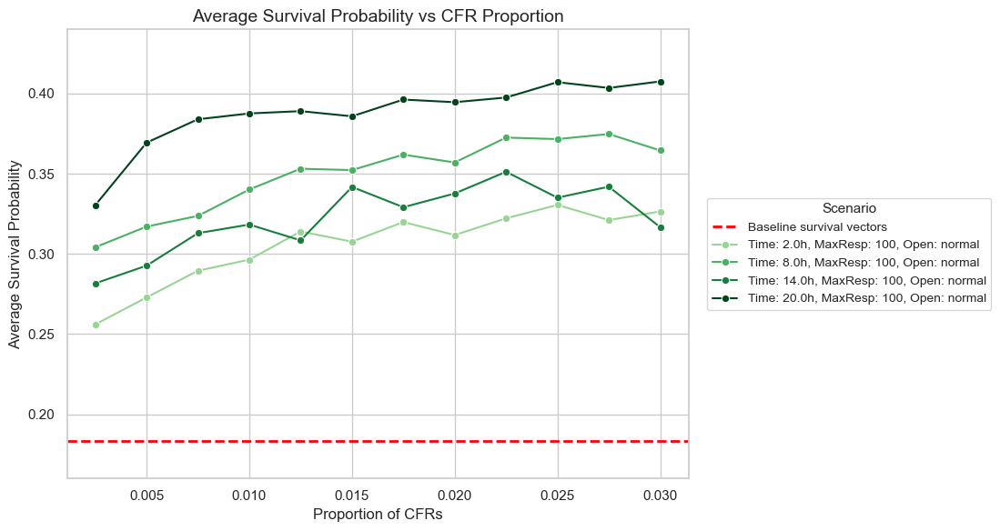

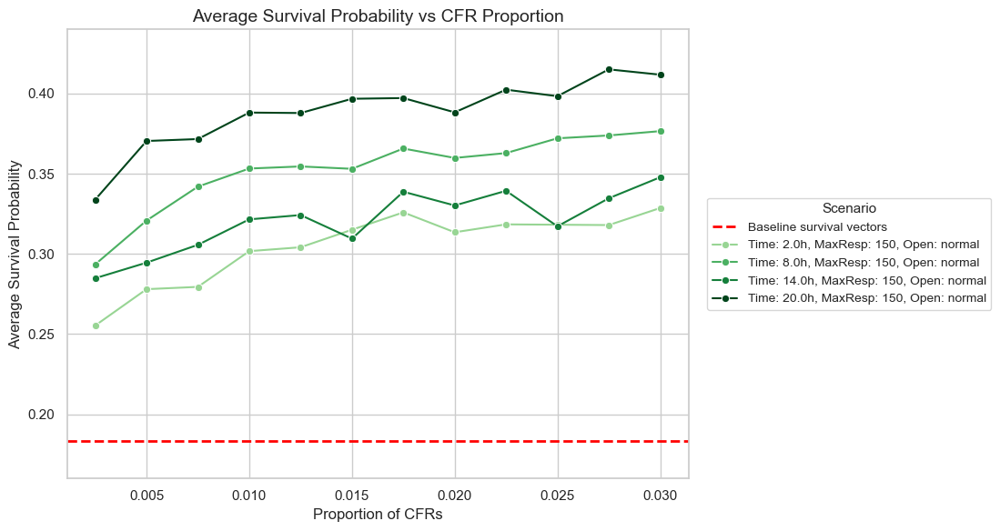

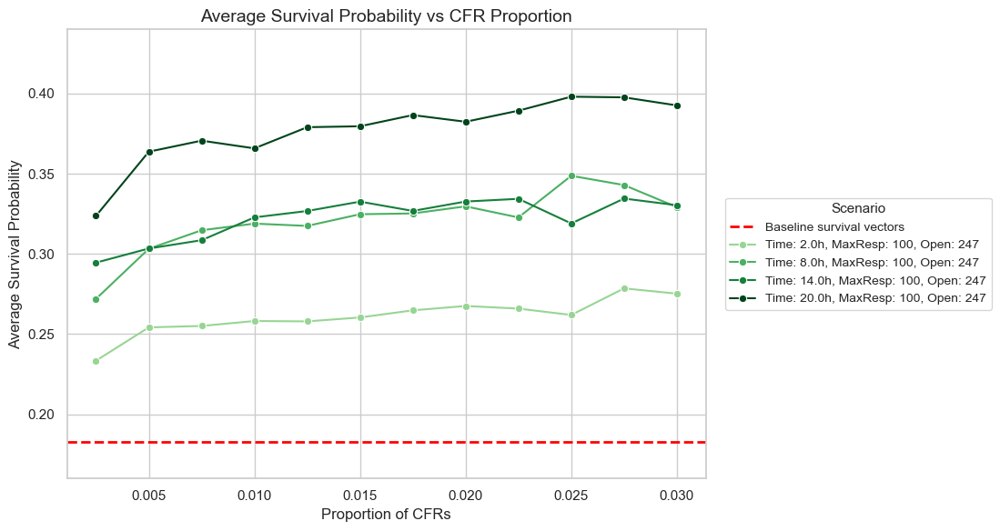

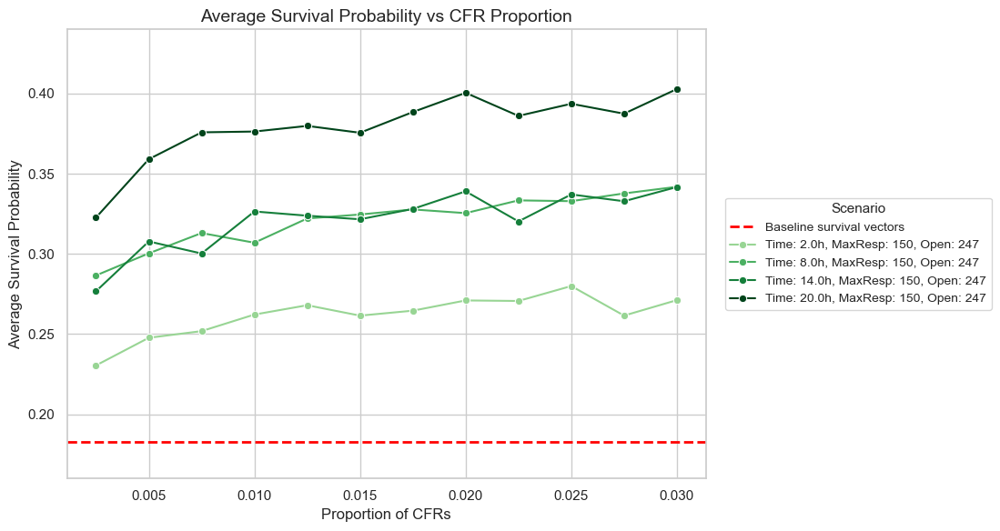

In [130]:
open_types = ["normal", "247"]
max_responders = [100, 150]


for opentype in open_types:
    for maxrep in max_responders:
        line_plot_seaborn([2.0,8.0,14.0,20.0],[0.0025, 0.005, 0.0075, 0.01, 0.0125, 0.015, 0.0175, 0.02, 0.0225, 0.025,0.0275, 0.03],[maxrep], "aedYes", [opentype], all_data)

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

def line_plot_seaborn_prelim(time, prop, aed_style, all_data):
    sns.set_theme(style="whitegrid")
    plt.figure(figsize=(8, 6))

    cmap = plt.colormaps["Greens"]
    start, stop = 0.4, 1.0
    colors = [cmap(start + (stop - start) * (i / (len(time) - 1))) for i in range(len(time))]

    for idx, i in enumerate(time):
        x_vals = []
        y_vals = []


        for j in prop:
            df = all_data[(i, j, aed_style)]
            mean = df["avg_resp_prob"].mean()
            proportion = df["proportion_of_CFR_run1"].mean()
            x_vals.append(proportion)
            y_vals.append(mean)
            
        sns.lineplot(x=x_vals, y=y_vals, label=f'Simulation at time: {i}', marker='o', color=colors[idx])

    plt.xlabel("Proportion of CFRs", fontsize=12)
    plt.ylabel("Average Survival Probability", fontsize=12)
    plt.title("Average Survival Probability vs CFR Proportion", fontsize=14)
    plt.legend(title="Scenario", fontsize=10, title_fontsize=11)
    plt.tight_layout()
    plt.show()


c:\Users\leonw\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\leonw\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\leonw\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\leonw\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

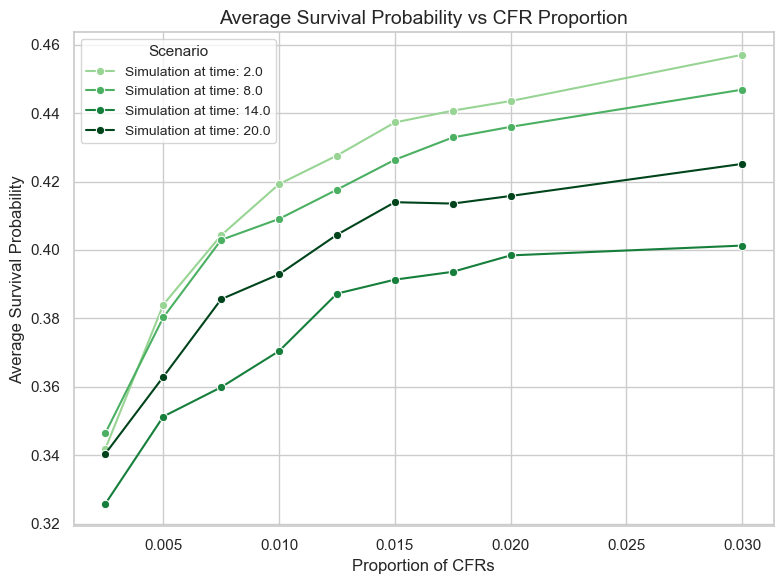

In [115]:
line_plot_seaborn_prelim([2.0,8.0, 14.0, 20.0],[0.0025, 0.005, 0.0075, 0.01, 0.0125, 0.015, 0.0175, 0.02, 0.03], "aedYes",  all_data)

In [57]:
#[0.001,0.0025, 0.005, 0.0075, 0.01, 0.0125, 0.015, 0.0175, 0.02, 0.03]
df_20_0p0175 = all_data[(20.0, 0.0175, "aedYes")]
df_filtered = df_20_0p0175[df_20_0p0175['duration_AED_run1']<9000]
print(len(df_filtered[df_filtered['duration_AED_run1']<df_filtered['duration_Vector_run1']]))

df_20_0p001 = all_data[(20.0, 0.001, "aedYes")]
df_filtered_2 = df_20_0p001[df_20_0p001['duration_AED_run1']<9000]
print(len(df_filtered_2[df_filtered_2['duration_AED_run1']<df_filtered_2['duration_Vector_run1']]))

df_20_0p03 = all_data[(20.0, 0.03, "aedYes")]
df_filtered_3 = df_20_0p03[df_20_0p03['duration_AED_run1']<9000]
print(len(df_filtered_3[df_filtered_3['duration_AED_run1']<df_filtered_3['duration_Vector_run1']]))

df_20_0p005 = all_data[(20.0, 0.005, "aedYes")]
df_filtered_4 = df_20_0p005[df_20_0p005['duration_AED_run1']<9000]
print(len(df_filtered_4[df_filtered_4['duration_AED_run1']<df_filtered_4['duration_Vector_run1']]))

KeyError: (20.0, 0.0175, 'aedYes')

In [25]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
from matplotlib.colors import to_rgb

def get_global_max_value(hours_list, props_list, style, all_data, maxresponder=None, opentypes=None, mode="aed"):
    max_val = 0
    run_cols = {
        "aed": ['duration_AED_run1', 'duration_AED_run2', 'duration_AED_run3'],
        "cfr": ['duration_Responder_run1', 'duration_Responder_run2', 'duration_Responder_run3']
    }
    vector_cols = ['duration_Vector_run1', 'duration_Vector_run2', 'duration_Vector_run3']

    for prop in props_list:
        for hour in hours_list:
            matching_keys = [
                key for key in all_data
                if key[0] == hour and key[1] == prop and key[3] == style and
                   (maxresponder is None or key[2] == maxresponder) and
                   (opentypes is None or key[4] == opentypes)
            ]
            if not matching_keys:
                continue

            df = all_data[matching_keys[0]]
            success_mask = np.zeros(len(df), dtype=bool)
            for aed_col, vec_col in zip(run_cols[mode], vector_cols):
                run_mask = (df[aed_col] < 9000) & (df[aed_col] < df[vec_col])
                success_mask |= run_mask

            count = success_mask.sum()
            if count > max_val:
                max_val = count
    return max_val

def generate_shades(base_color_hex, n, lighten=0.4):
    base_rgb = np.array(to_rgb(base_color_hex))
    white = np.ones(3)
    shades = [(1 - lighten) * base_rgb + lighten * white * (i / (n - 1)) for i in range(n)]
    return shades

def radial_bar_CFRS_by_hour(hours, prop, style, all_data, maxresponder=None, opentypes=None, global_max=1):
    run_cols = ['duration_Responder_run1', 'duration_Responder_run2', 'duration_Responder_run3']
    vector_cols = ['duration_Vector_run1', 'duration_Vector_run2', 'duration_Vector_run3']

    labels = []
    values = []
    theta = []
    bar_colors = []

    base_colors = generate_shades('#104862', len(hours), lighten=0.3)
    gap = 0.1  # radians of space between hour segments
    bar_width = (2 * np.pi - gap * len(hours)) / len(hours)

    current_angle = 0

    for hour_idx, hour in enumerate(hours):
        base_color = base_colors[hour_idx]

        # Find the best matching key
        matching_keys = [
            key for key in all_data
            if key[0] == hour and key[1] == prop and key[3] == style and
               (maxresponder is None or key[2] == maxresponder) and
               (opentypes is None or key[4] == opentypes)
        ]

        if not matching_keys:
            print(f"⚠️ No data for hour={hour}, prop={prop}, style={style}, maxresp={maxresponder}, opentype={opentypes}")
            values.append(0)
            labels.append(f"{hour} o'clock")
            theta.append(current_angle)
            bar_colors.append(mcolors.to_rgba(base_color, alpha=0.8))
            current_angle += bar_width + gap
            continue

        df = all_data[matching_keys[0]]

        # Count successes averaged over 3 runs
        success_mask = np.zeros(len(df), dtype=bool)
        for aed_col, vec_col in zip(run_cols, vector_cols):
            run_mask = (df[aed_col] < 9000) & (df[aed_col] < df[vec_col])
            success_mask |= run_mask

        count = success_mask.sum()
        values.append(count)
        theta.append(current_angle)
        bar_colors.append(mcolors.to_rgba(base_color, alpha=0.8))
        labels.append(f"{hour} o'clock")

        current_angle += bar_width + gap

    # Plot
    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(13, 11))
    bars = ax.bar(theta, values, width=bar_width, color=bar_colors, edgecolor='black')

    # Value labels
    for angle, bar, value in zip(theta, bars, values):
        radius = bar.get_height() *0.7
        #offset = 0.9 if radius < 5 else -0.5
        rotation = np.rad2deg(angle)

        if np.pi/2 < angle < 3*np.pi/2:
            alignment = 'center'
            rotation += 180
        else:
            alignment = 'center'

        ax.text(angle, radius, f"{value}", ha=alignment, va='center',
                fontsize=28, color='black', rotation=rotation, rotation_mode='anchor')

    ax.set_xticks(theta)
    ax.set_xticklabels(labels, fontsize=20)
    ax.set_theta_direction(-1)
    ax.set_theta_offset(np.pi / 2.0)
    ax.set_ylim(0, global_max+25)
    ax.set_yticklabels([])
    ax.spines['polar'].set_visible(False)

    title = f'Average CFR Deployments - {prop*100:.2f}% CFRs'
    if maxresponder:
        title += f", MaxResp={maxresponder}"
    if opentypes:
        title += f", Open={opentypes}"
    ax.set_title(title, fontsize=28, pad=20)

    plt.tight_layout()
    plt.savefig(f'C:/Users/leonw/OneDrive - KU Leuven/4th semester/Statistical Consulting/Visualizations/radial_bar_CFR_{hour}_prop{prop}_style{style}_maxresp_{maxresponder}_opentype_{opentypes}.png')
    


def radial_bar_aeds_by_hour(hours, prop, style, all_data, maxresponder=None, opentypes=None, global_max=1):
    run_cols = ['duration_AED_run1', 'duration_AED_run2', 'duration_AED_run3']
    vector_cols = ['duration_Vector_run1', 'duration_Vector_run2', 'duration_Vector_run3']

    labels = []
    values = []
    theta = []
    bar_colors = []

    base_colors = generate_shades('#71AD25', len(hours), lighten=0.3)
    gap = 0.1  # radians of space between hour segments
    bar_width = (2 * np.pi - gap * len(hours)) / len(hours)

    current_angle = 0

    for hour_idx, hour in enumerate(hours):
        base_color = base_colors[hour_idx]

        # Find the best matching key
        matching_keys = [
            key for key in all_data
            if key[0] == hour and key[1] == prop and key[3] == style and
               (maxresponder is None or key[2] == maxresponder) and
               (opentypes is None or key[4] == opentypes)
        ]

        if not matching_keys:
            print(f"⚠️ No data for hour={hour}, prop={prop}, style={style}, maxresp={maxresponder}, opentype={opentypes}")
            values.append(0)
            labels.append(f"{hour} o'clock")
            theta.append(current_angle)
            bar_colors.append(mcolors.to_rgba(base_color, alpha=0.8))
            current_angle += bar_width + gap
            continue

        df = all_data[matching_keys[0]]

        # Count successes averaged over 3 runs
        success_mask = np.zeros(len(df), dtype=bool)
        for aed_col, vec_col in zip(run_cols, vector_cols):
            run_mask = (df[aed_col] < 9000) & (df[aed_col] < df[vec_col])
            success_mask |= run_mask

        count = success_mask.sum()
        values.append(count)
        theta.append(current_angle)
        bar_colors.append(mcolors.to_rgba(base_color, alpha=0.8))
        labels.append(f"{hour} o'clock")

        current_angle += bar_width + gap

    # Plot
    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(13, 11))
    bars = ax.bar(theta, values, width=bar_width, color=bar_colors, edgecolor='black')

    # Value labels
    for angle, bar, value in zip(theta, bars, values):
        radius = bar.get_height() *0.7
        #offset = 0.9 if radius < 5 else -0.5
        rotation = np.rad2deg(angle)

        if np.pi/2 < angle < 3*np.pi/2:
            alignment = 'center'
            rotation += 180
        else:
            alignment = 'center'

        ax.text(angle, radius, f"{value}", ha=alignment, va='center',
                fontsize=28, color='black', rotation=rotation, rotation_mode='anchor')

    ax.set_xticks(theta)
    ax.set_xticklabels(labels, fontsize=20)
    ax.set_theta_direction(-1)
    ax.set_theta_offset(np.pi / 2.0)
    ax.set_ylim(0, global_max+25)
    ax.set_yticklabels([])
    ax.spines['polar'].set_visible(False)

    title = f'Average AED Deployments - {prop*100:.2f}% CFRs'
    if maxresponder:
        title += f", MaxResp={maxresponder}"
    if opentypes:
        title += f", Open={opentypes}"
    ax.set_title(title, fontsize=28, pad=20)

    plt.tight_layout()
    plt.savefig(f'C:/Users/leonw/OneDrive - KU Leuven/4th semester/Statistical Consulting/Visualizations/radial_bar_AED_{hour}_prop{prop}_style{style}_maxresp_{maxresponder}_opentype_{opentypes}.png')

313
226


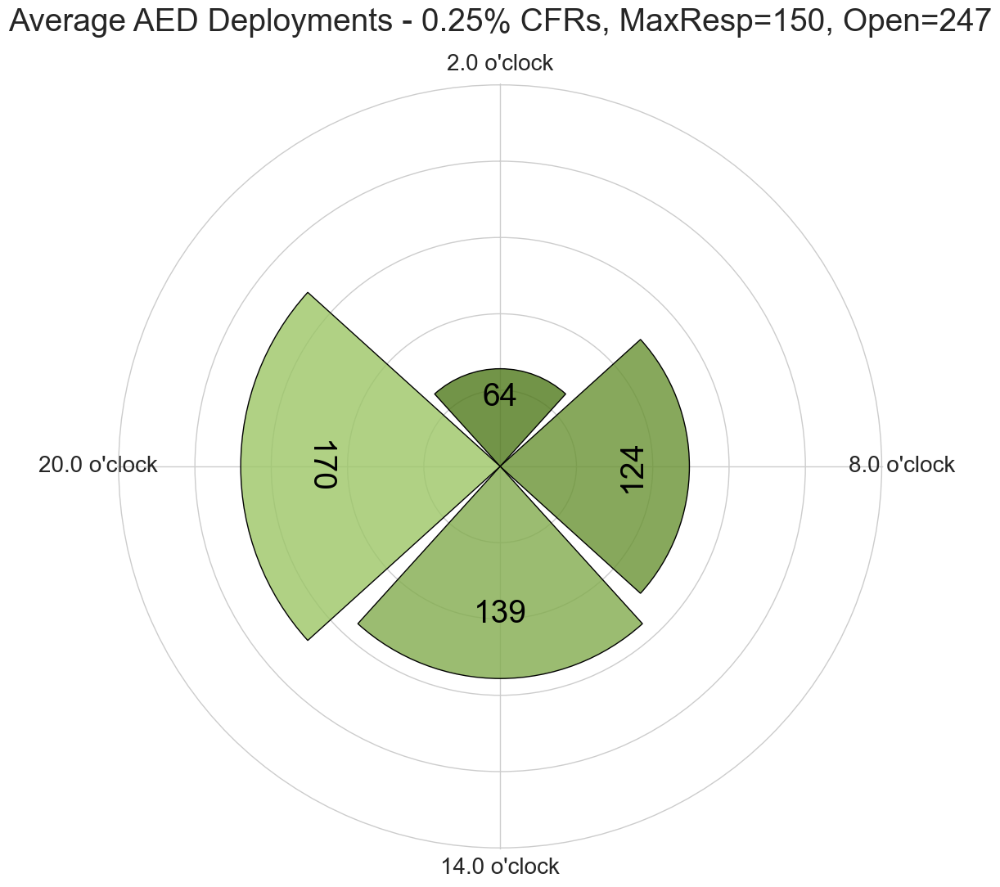

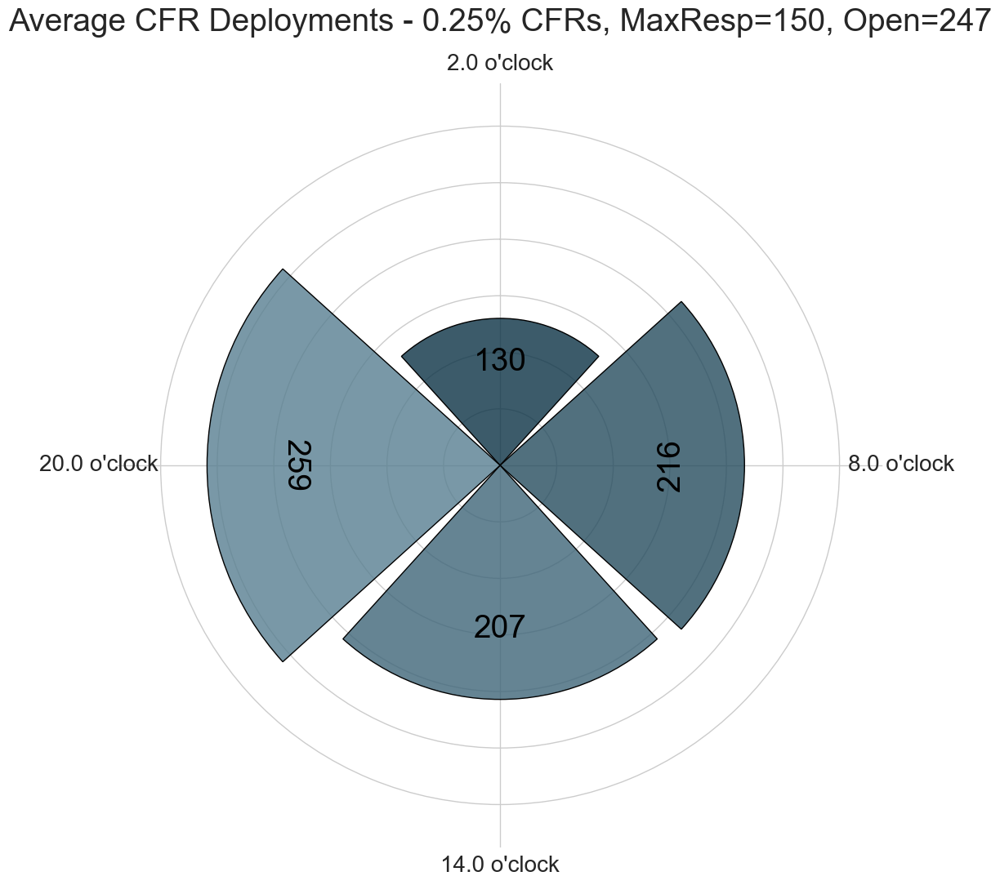

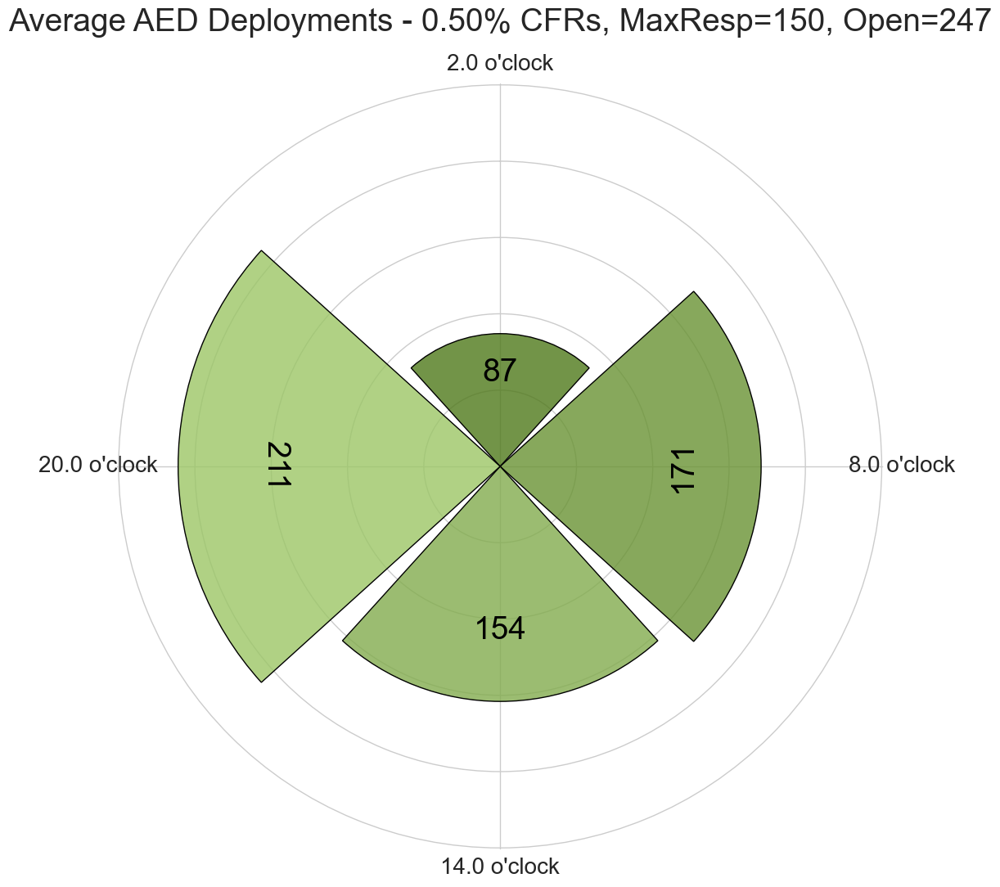

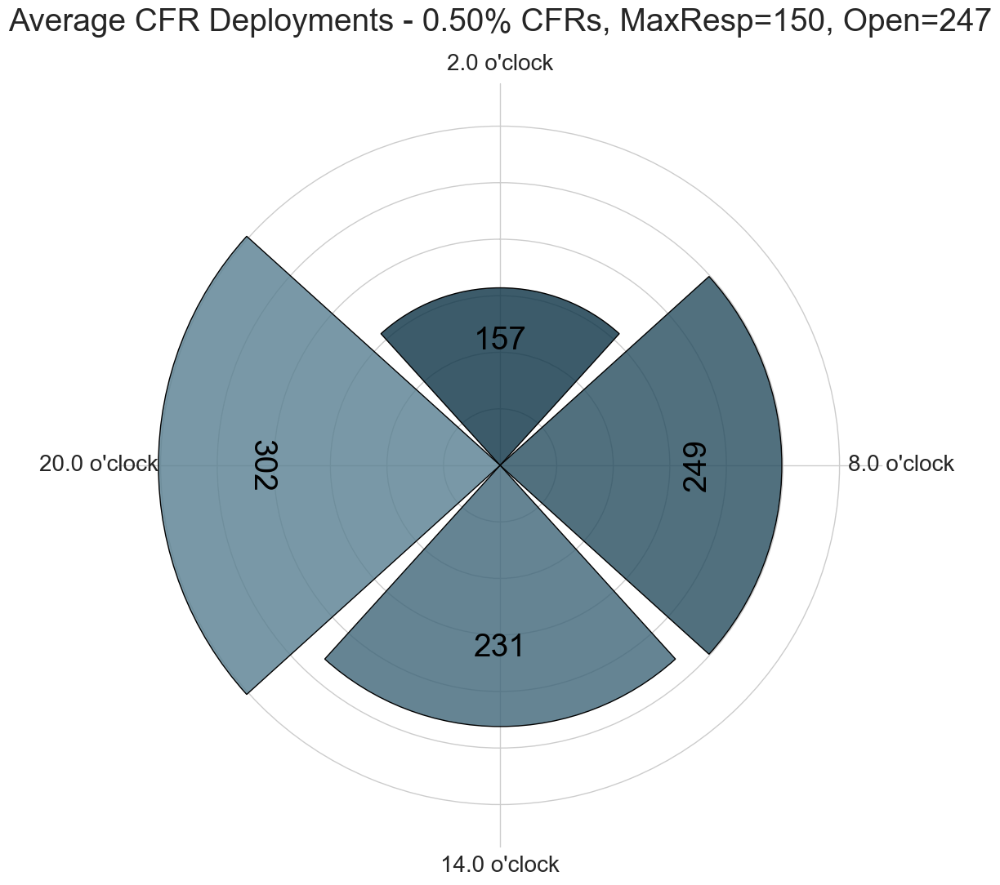

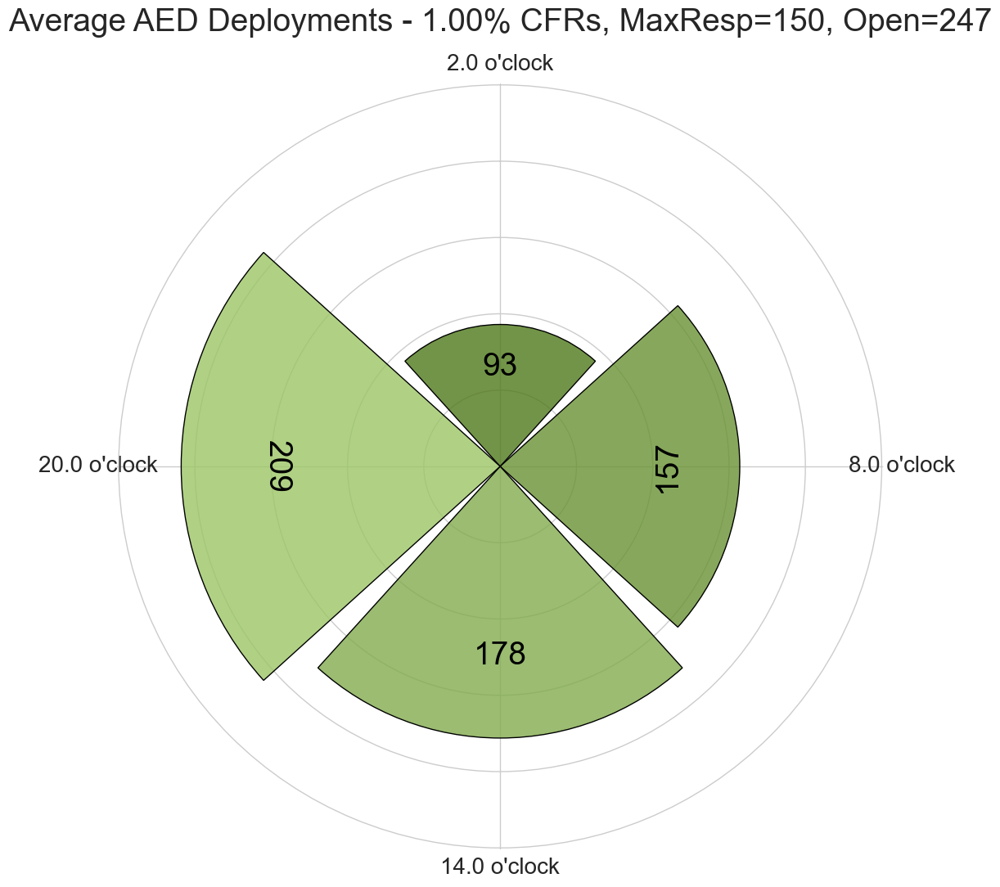

...

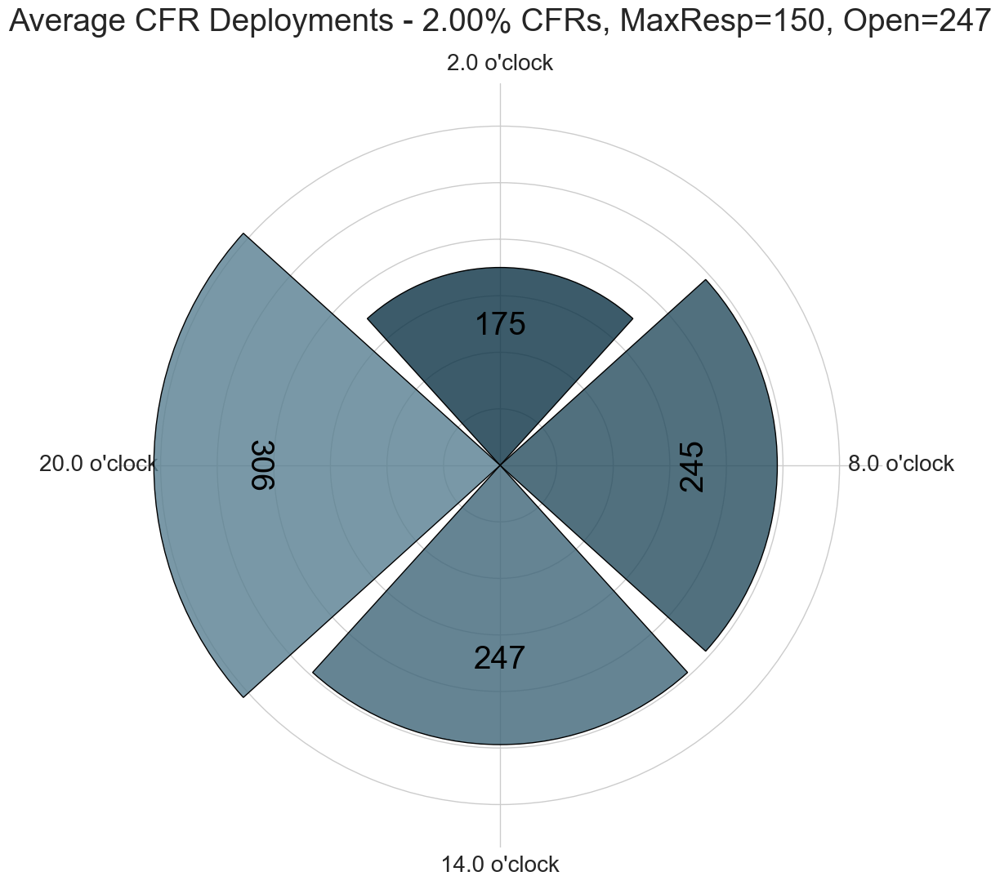

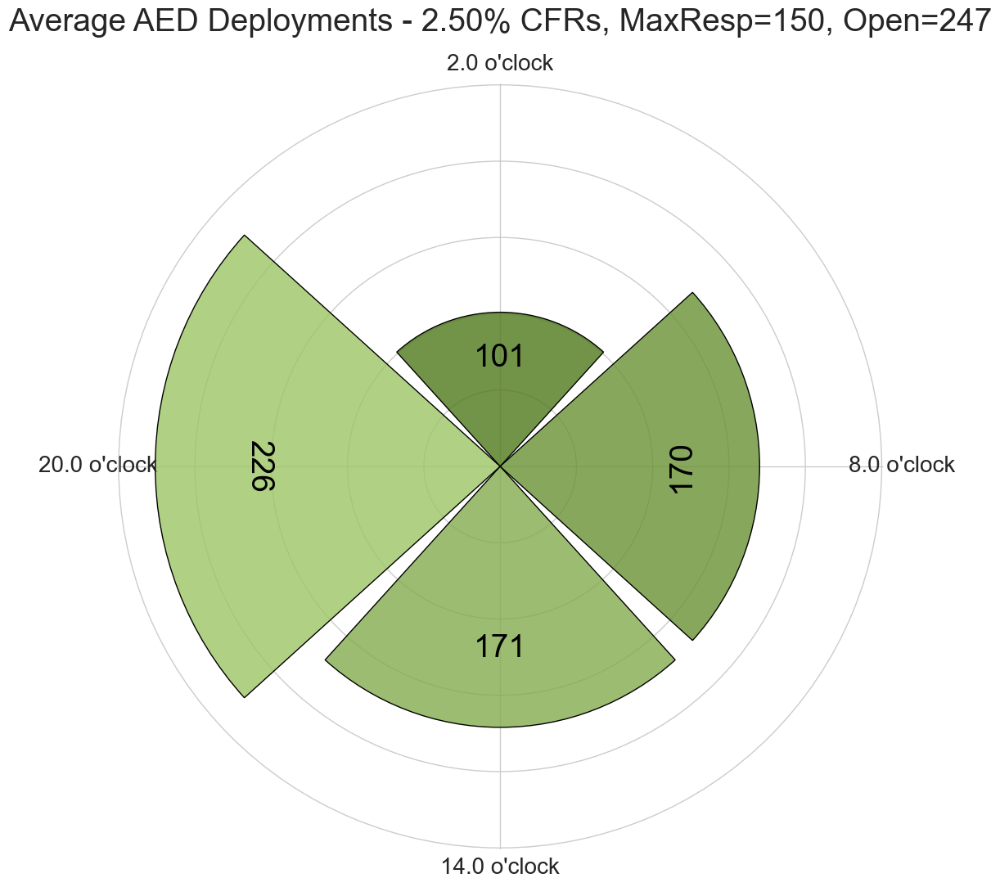

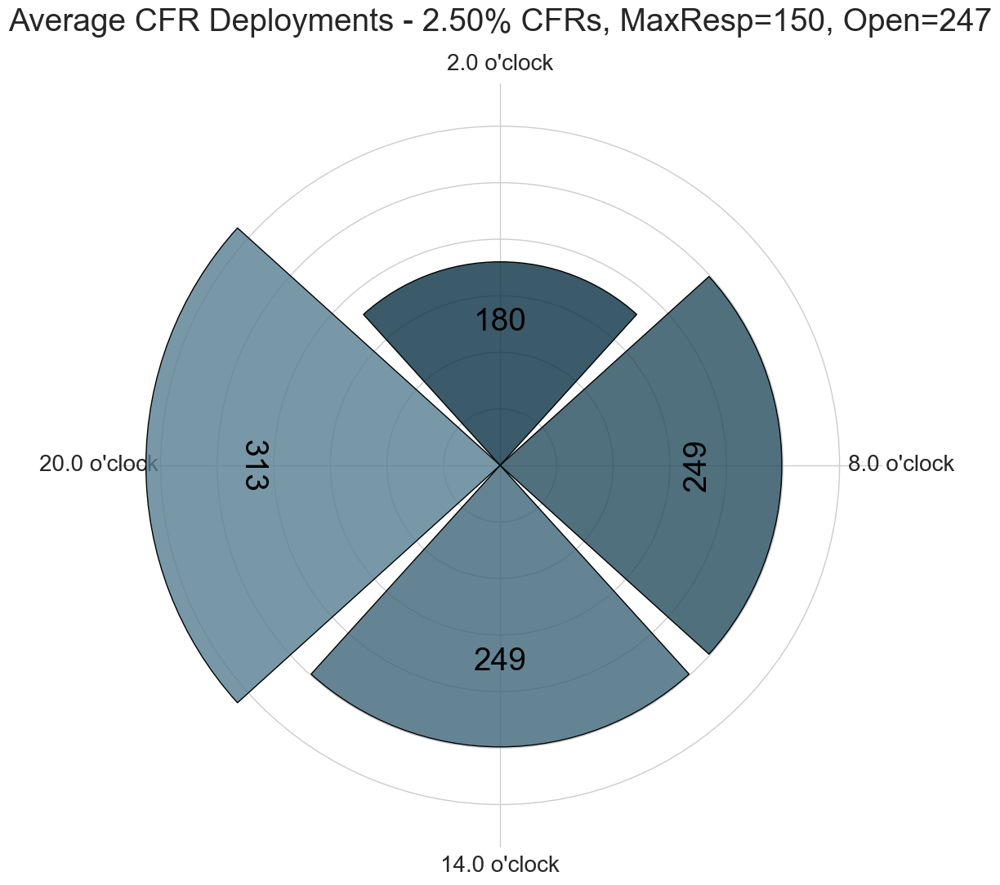

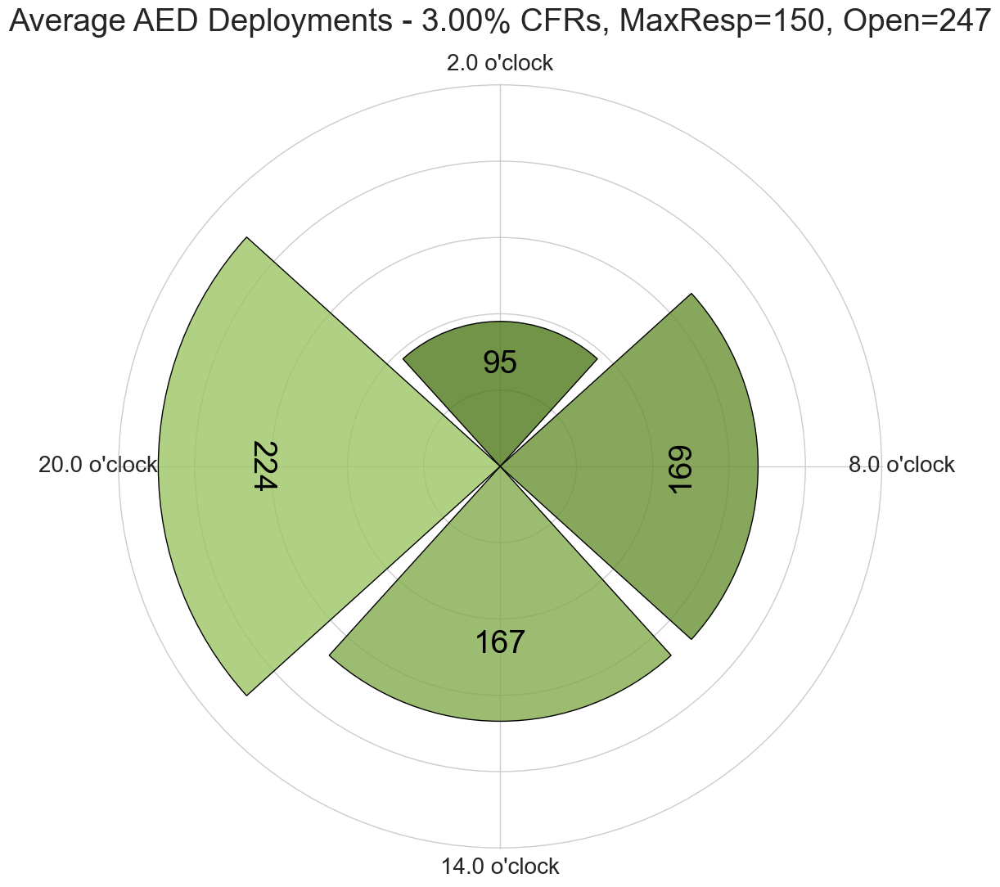

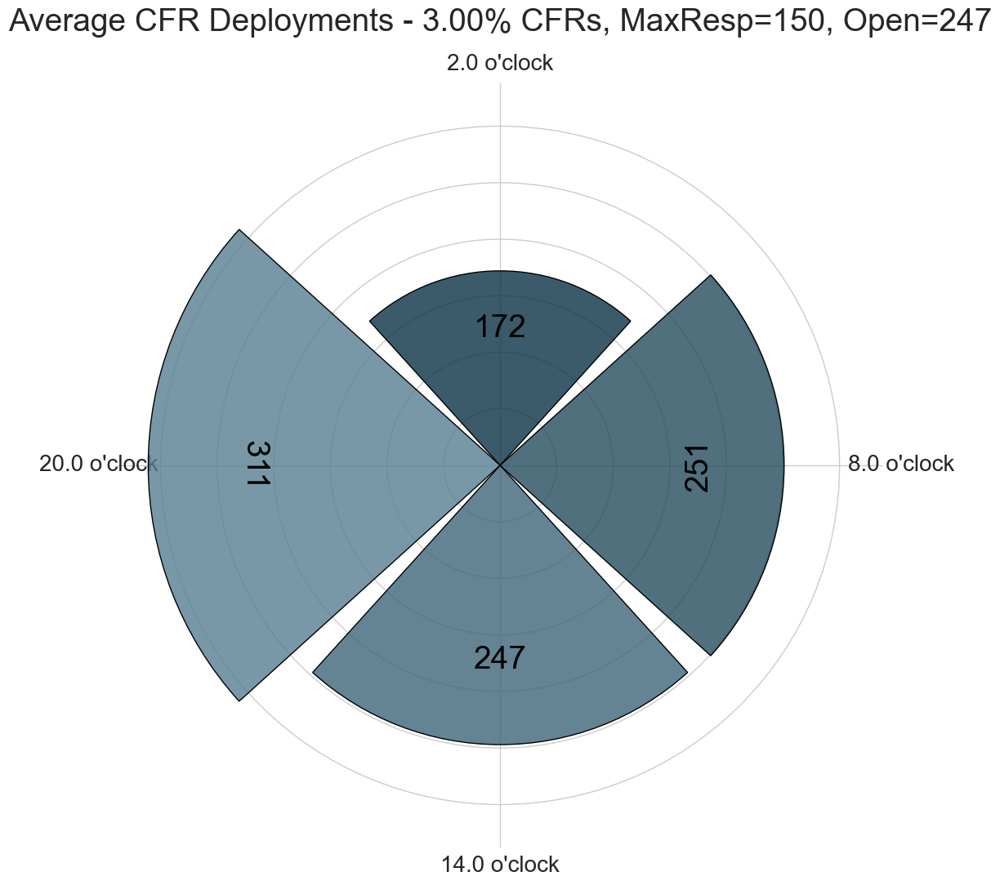

In [29]:
hours = [2.0, 8.0, 14.0, 20.0]
props = [0.0025, 0.005, 0.01, 0.02, 0.025, 0.03]
style = "aedYes"
opentype = "247"
maxresp = 150

global_max_cfr = get_global_max_value(hours, props, style, all_data, maxresponder=maxresp, opentypes=opentype, mode="cfr")
print(global_max_cfr)
global_max_aed = get_global_max_value(hours, props, style, all_data, maxresponder=maxresp, opentypes=opentype, mode="aed")
print(global_max_aed)

for prop in props:
    radial_bar_aeds_by_hour(hours, prop, style, all_data, maxresponder=maxresp, opentypes=opentype, global_max=global_max_aed)
    radial_bar_CFRS_by_hour(hours, prop, style, all_data, maxresponder=maxresp, opentypes=opentype, global_max=global_max_cfr)

In [126]:
means_resp_2 = (df_test["prob_resp_run1"].mean() + df_test["prob_resp_run2"].mean()+df_test["prob_resp_run3"].mean())/3
means_resp_8 = (df_test_2["prob_resp_run1"].mean()+ df_test_2["prob_resp_run2"].mean()+df_test_2["prob_resp_run3"].mean())/3
means_vec = (df_test["prob_vec_run1"].mean()+ df_test["prob_vec_run2"].mean()+df_test["prob_vec_run3"].mean())/3

print(f'CFR 0.25% survival at 2 a.m.:{means_resp_2}')
print(f'CFR 0.25% survival at 8 a.m.: {means_resp_8}')
print(f'Mean vector: {means_vec}')

CFR 0.25% survival at 2 a.m.:0.23139005070818053
CFR 0.25% survival at 8 a.m.: 0.2718326181328592
Mean vector: 0.18318086896312713


In [ ]:
def violin_plot(hours, props, style, all_data, maxresponder=100, opentype="normal"):
    data = []
    labels = []
    
    for hour in hours:
        for prop in props:
            key = (hour, prop, maxresponder, style, opentype)
            if key not in all_data:
                print(f"⚠️ Missing data for {key}")
                continue

            df = all_data[key]
            values = pd.to_numeric(df["avg_resp_prob"], errors='coerce').dropna()
            if len(values) == 0:
                print(f"⚠️ No valid data in {key}")
                continue

            data.append(values)
            labels.append(f"{hour}h CFR={prop}")

    if not data:
        print("❌ No data to plot.")
        return

    plt.figure(figsize=(10, 6))
    plt.violinplot(data, showmeans=True, showmedians=True)
    plt.xticks(ticks=np.arange(1, len(labels) + 1), labels=labels, rotation=30)
    plt.ylim(-0.02, )
    plt.title("Distribution of Survival Probability")
    plt.ylabel("Average Survival Probability")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f'C:/Users/leonw/OneDrive - KU Leuven/4th semester/Statistical Consulting/Visualizations/violin_plot_{hour}_prop{prop}_style{style}_maxresp_{maxresponder}_opentype_{opentypes}.png')

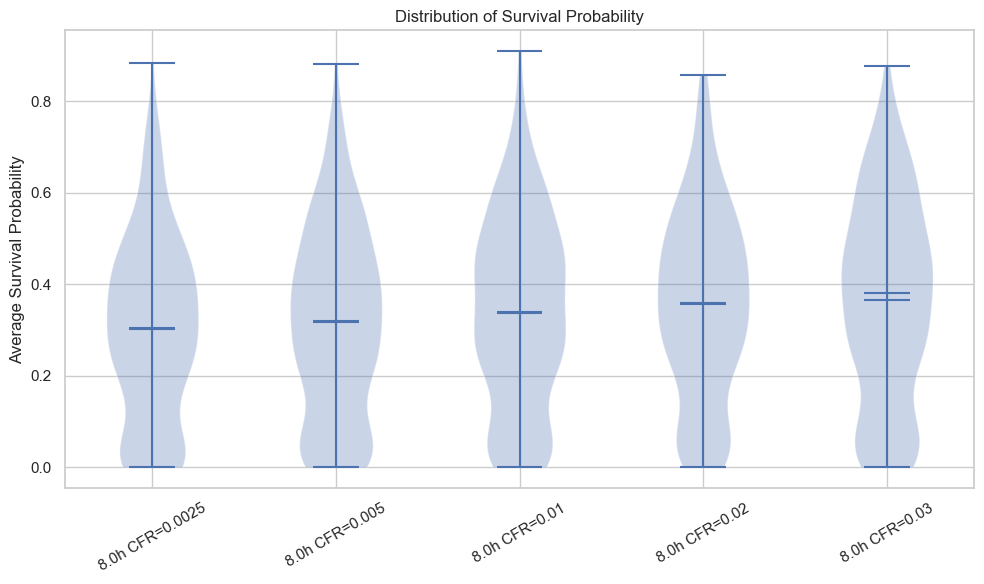

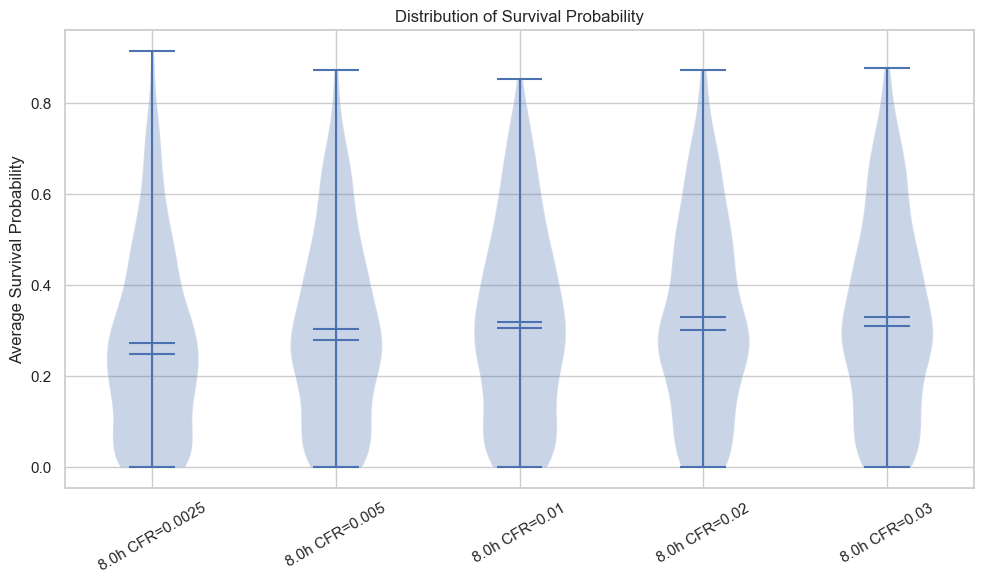

In [39]:
for ot in ["normal", "247"]:
    violin_plot([8.0], [0.0025, 0.005, 0.01, 0.02, 0.03], "aedYes", all_data, opentype=ot)

# Show the AED availability

In [3]:
import pandas as pd
import numpy as np
import geopandas as gpd
import os
import openrouteservice

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Own Classes
from Simulation_Routing import *
from Simulating import *
from Simulation_Routing_Matrix import *
from Simulation_Routing_Matrix_copy import *
from Simulation_Routing_Matrix_Batch import *
from tqdm import tqdm
import json
from geojson import Feature, FeatureCollection, LineString

In [4]:
ip = 34.56

In [18]:
sim = RoutingSimulationMatrixBatch(ip)

In [19]:
xw = sim.AED_ISO.copy()

In [20]:
def normalize_lat(x):
    if x > 1e10:
        return x / 1e9
    elif x > 1e9:
        return x / 1e8
    elif x > 1e8:
        return x / 1e7
    elif x > 1e7:
        return x / 1e6
    elif x > 1e6:
        return x / 1e5
    elif x > 1e5:
        return x / 1e4
    elif x > 1e4:
        return x / 1e3
    elif x > 1e3:
        return x / 1e2
    elif x > 1e2:
        return x / 1e1
    else:
        return x

def normalize_lon(x):
    if x > 1e10:
        return x / 1e10
    elif x > 1e9:
        return x / 1e9
    elif x > 1e8:
        return x / 1e8
    elif x > 1e7:
        return x / 1e7
    elif x > 1e6:
        return x / 1e6
    elif x > 1e5:
        return x / 1e5
    elif x > 1e4:
        return x / 1e4
    elif x > 1e3:
        return x / 1e3
    elif x > 1e2:
        return x / 1e2
    else:
        return x

In [21]:
from shapely.geometry import Point
xw = sim.AED_ISO.copy()
xw.head()
xw = xw.drop(["available", "Checked", "Opens", "Closes"], axis = 1)

gdf = pd.read_csv(
    "C:/Users/leonw/OneDrive - KU Leuven/Documents/GitHub/AED-Route-Optimization-MDA-Project/Data/aed_sim_hours.csv",
    sep=';',  # ← this is the key fix
    encoding='unicode_escape'
)
gdf = gdf.dropna(subset=['longitude', 'latitude'])

gdf['latitude']  = gdf['latitude'].clip(upper=1e10)
gdf['longitude'] = gdf['longitude'].clip(upper=1e10)

gdf['latitude'] =gdf['latitude'].apply(normalize_lat)
gdf['longitude'] = gdf['longitude'].apply(normalize_lon)

gdf['latitude'] = gdf['latitude'].astype(float)
gdf['longitude'] = gdf['longitude'].astype(float)
xw['latitude'] = xw['latitude'].astype(float)
xw['longitude'] = xw['longitude'].astype(float)

gdf_AED = pd.merge(gdf, xw, on=["latitude", "longitude"], how="inner")

# xw['latitude'] = xw['latitude'].round(4)
# xw['longitude'] = xw['longitude'].round(4)




In [22]:
import geopandas as gpd
from shapely.geometry import Point


gdf_AED.loc[:,'AED'] = list(zip(gdf_AED['longitude'], gdf_AED['latitude']))
gdf_AED.head()
# Convert AED column to Points if not already in geometry format
if not isinstance(gdf_AED['AED'].iloc[0], Point):
    gdf_AED['AED'] = gdf_AED['AED'].apply(lambda coords: Point(coords) if isinstance(coords, (list, tuple)) else coords)
# Convert to GeoDataFrame
gdf_AED = gpd.GeoDataFrame(gdf_AED, geometry='AED')
# Set AED as the active geometry column in the GeoDataFrame


In [23]:
gdf_AED

,id,number,postal_code,public,available,Opens,Closes,latitude,longitude,Checked,geometry,AED
0,2741.0,58,3012.0,Y,NaN,00:00,00:00,50.893353,4.707561,FALSE,"POLYGON ((4.70674 50.89899, 4.70673 50.89892, ...",POINT (4.70756 50.89335)
1,1905.0,730,3012.0,Y,couldn't find,00:00,00:00,50.928122,4.724020,Yes,"POLYGON ((4.71509 50.92497, 4.71528 50.92466, ...",POINT (4.72402 50.92812)
2,3076.0,163,3012.0,N,NaN,08:30,22:30,50.910898,4.713118,Yes,"POLYGON ((4.70643 50.91046, 4.70659 50.90975, ...",POINT (4.71312 50.91090)
3,10696.0,15,3010.0,Y,Yes,00:00,24:00:00,50.891918,4.734149,Yes,"POLYGON ((4.72414 50.88829, 4.72428 50.88796, ...",POINT (4.73415 50.89192)
4,4991.0,2,3010.0,N,NaN,00:00,00:00,50.876465,4.727593,No,"POLYGON ((4.71895 50.87788, 4.71928 50.87302, ...",POINT (4.72759 50.87647)
...,...,...,...,...,...,...,...,...,...,...,...,...
223,NaN,3,3000.0,Y,Yes,00:00,24:00:00,50.876091,4.705817,Yes,"POLYGON ((4.69572 50.87563, 4.69713 50.87271, ...",POINT (4.70582 50.87609)
224,2334.0,4,3000.0,Y,Yes,00:00,24:00:00,50.885883,4.710646,Yes,"POLYGON ((4.69977 50.88727, 4.70062 50.88519, ...",POINT (4.71065 50.88588)
225,12603.0,40,3001.0,Y,Yes,08:30,16:30,50.858007,4.678102,Yes,"POLYGON ((4.67428 50.85392, 4.67454 50.85368, ...",POINT (4.67810 50.85801)
226,NaN,40,3001.0,Y,Yes,08:30,17:00,50.860550,4.680393,Yes,"POLYGON ((4.67302 50.85875, 4.67456 50.85545, ...",POINT (4.68039 50.86055)


In [36]:
df_8_0p0175 = all_data[(2.0,
  0.0025,
  'aedYes')]
df_8_0p0175

,patient_loc,responder_loc_run1,duration_Responder_run1,Indirect_Responder_loc_run1,aed_loc_run1,duration_AED_run1,vector_loc_run1,duration_Vector_run1,prob_vec_run1,prob_resp_run1,...,prob_resp_run3,filter_values_run3,opening_hour_run3,decline_rate_run3,max_number_responder_run3,proportion_of_CFR_run3,avg_resp_prob,openhr,cfr,aed
0,"(4.724486, 50.875134)","(4.723115454324877, 50.873149766641546)",335.69,No AED,No AED,10000.0,"(4.7243436, 50.8696549)",641.37,0.324247,0.474899,...,0.485515,Yes,2.0,0.75,100.0,0.0025,0.522941,2.0,0.0025,Yes
1,"(4.663458, 50.872624)",No responder,10000.00,No AED,No AED,10000.0,"(4.6658621, 50.8774603)",621.19,0.335943,0.335943,...,0.335943,Yes,2.0,0.75,100.0,0.0025,0.368709,2.0,0.0025,Yes
2,"(4.706287, 50.868107)","(4.707186437783226, 50.86963704826801)",194.11,No AED,No AED,10000.0,"(4.6998331, 50.8723536)",618.41,0.337587,0.573352,...,0.496676,Yes,2.0,0.75,100.0,0.0025,0.530631,2.0,0.0025,Yes
3,"(4.729334, 50.886379)","(4.729168808147578, 50.88433925958511)",361.73,No AED,No AED,10000.0,"(4.7243436, 50.8696549)",1978.53,0.030983,0.233173,...,0.194641,Yes,2.0,0.75,100.0,0.0025,0.223860,2.0,0.0025,Yes
4,"(4.7093, 50.870361)","(4.70695970966286, 50.87511548616282)",486.86,No AED,No AED,10000.0,"(4.6998331, 50.8723536)",750.80,0.267560,0.371978,...,0.529718,Yes,2.0,0.75,100.0,0.0025,0.492393,2.0,0.0025,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
383,"(4.692054, 50.883744)","(4.68949850546593, 50.883567252367875)",166.55,No AED,No AED,10000.0,"(4.6953981, 50.8785355)",612.09,0.341354,0.595328,...,0.626271,Yes,2.0,0.75,100.0,0.0025,0.617313,2.0,0.0025,Yes
384,"(4.676329, 50.867263)","(4.678698334022509, 50.866726563622954)",132.07,No AED,No AED,10000.0,"(4.6658621, 50.8774603)",1466.98,0.076075,0.402690,...,0.184961,Yes,2.0,0.75,100.0,0.0025,0.280350,2.0,0.0025,Yes
385,"(4.676351, 50.870025)","(4.671335165442814, 50.87179352726807)",369.62,No AED,No AED,10000.0,"(4.6658621, 50.8774603)",934.56,0.193768,0.392252,...,0.193768,Yes,2.0,0.75,100.0,0.0025,0.380327,2.0,0.0025,Yes
386,"(4.71405, 50.873746)","(4.713785130480335, 50.87457150581778)",60.97,No AED,No AED,10000.0,"(4.7243436, 50.8696549)",693.89,0.295680,0.651572,...,0.663382,Yes,2.0,0.75,100.0,0.0025,0.615766,2.0,0.0025,Yes


In [11]:
import geopandas as gpd

In [32]:
import ast
import geopandas as gpd
from shapely.geometry import Point

# Step 1: Convert string to tuple
df_8_0p0175['patient_loc_parsed'] = df_8_0p0175['patient_loc'].apply(
    lambda s: ast.literal_eval(s) if isinstance(s, str) else s
)

# Step 2: Convert tuple to Point
geometry = df_8_0p0175['patient_loc_parsed'].apply(
    lambda coords: Point(*coords) if isinstance(coords, (list, tuple)) and len(coords) == 2 else None
)

# Step 3: Create GeoDataFrame
geometry = geometry.dropna()
gdf = gpd.GeoDataFrame(geometry=geometry, crs="EPSG:4326")

In [33]:
df_8_0p0175['patient_loc'].apply(type).value_counts()

patient_loc
<class 'str'>    373
Name: count, dtype: int64

In [34]:
gdf

,geometry
16,POINT (4.70213 50.89726)
17,POINT (4.70586 50.88161)
19,POINT (4.65733 50.86143)
20,POINT (4.71273 50.87904)
21,POINT (4.72881 50.89892)
...,...
387,POINT (4.71974 50.90031)
388,POINT (4.69205 50.88374)
390,POINT (4.67635 50.87002)
391,POINT (4.71405 50.87375)


In [35]:
simulation = Simulation(ip)

In [36]:
df_vector = simulation.VECTORS.copy()
print(len(df_vector))
# Step 1: Convert string to tuple
df_vector['coordinates_parsed'] = df_vector['coordinates'].apply(
    lambda s: ast.literal_eval(s) if isinstance(s, str) else s
)

# Step 2: Convert tuple to Point
geometry = df_vector['coordinates_parsed'].apply(
    lambda coords: Point(*coords) if isinstance(coords, (list, tuple)) and len(coords) == 2 else None
)

# Step 3: Create GeoDataFrame
geometry = geometry.dropna()
gdf_vector = gpd.GeoDataFrame(geometry=geometry, crs="EPSG:4326")

11


In [37]:
gdf_vector.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 11 entries, 0 to 10
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  11 non-null     geometry
dtypes: geometry(1)
memory usage: 176.0 bytes


In [40]:
import folium
import geopandas as gpd
from shapely.geometry import Point

gdf_AED = gdf_AED.dropna(subset=['latitude', 'longitude'])
#gdf_AED = gdf_AED[gdf_AED["available"]=="Yes"]
#xw = xw.dropna(subset=['latitude', 'longitude'])

# Initialize a folium map centered around the average AED location
m = folium.Map(location=[gdf_AED['AED'].y.mean(), gdf_AED['AED'].x.mean()], tiles="Cartodb Positron", zoom_start=13)

for _, row in gdf.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup="Patient",
        icon=folium.Icon(color='red', icon='person', prefix='fa')
    ).add_to(m)

    # folium.CircleMarker(
    #     location=[row.geometry.y, row.geometry.x],
    #     radius=1,
    #     color='red',
    #     fill=True,
    #     fill_color='red',
    #     fill_opacity=0.2,
    #     popup="Patient"
    # ).add_to(m)


'''

for _, row in gdf_vector.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=2,
        color='orange',
        fill=True,
        fill_color='orange',
        fill_opacity=0.2,
        popup="Vector"
    ).add_to(m)


   
for _, row in gdf_vector.iterrows():
    folium.Marker(
        location=[row['geometry'].y, row['geometry'].x],
        popup="Vector",
        icon=folium.Icon(color='orange', icon='truck-medical', prefix='fa')
    ).add_to(m)

# Add isochrones (polygons) to the map
for _, row in gdf_AED.iterrows():
    if row["available"]=="Yes":
        folium.GeoJson(
            row['geometry'],
            style_function=lambda x: {
                'fillColor': 'green',
                "dashArray": "5, 5",
                'color': 'darkgreen',
                'weight': 1,
                'fillOpacity': 0.02
            }
            ).add_to(m)
    else:
        folium.GeoJson(
            row['geometry'],
            style_function=lambda x: {
                'fillColor': 'orange',
                "dashArray": "5, 5",
                'color': 'darkred',
                'weight': 1,
                'fillOpacity': 0.01
            }
            ).add_to(m)

# Add AED points to the map
for _, row in gdf_AED.iterrows():
    if row["available"]=="Yes":
        folium.Marker(
            location=[row['AED'].y, row['AED'].x],
            popup="AED",
            icon=folium.Icon(color='green', icon='heartbeat', prefix='fa')
        ).add_to(m)
    else:
        folium.Marker(
            location=[row['AED'].y, row['AED'].x],
            popup="AED",
            icon=folium.Icon(color='orange', icon='heartbeat', prefix='fa')
        ).add_to(m)
'''

   

# Save and display the map
m.save("patient_map.html")

In [84]:
aeds = gdf_AED
new_open = aeds["Opens"].str.split(":", n=1, expand=True)
new_open = new_open.apply(pd.to_numeric, errors='coerce') 
new_open['TIME'] = new_open[0] + (new_open[1] / 60)
aeds['Opens'] = new_open['TIME']

new_close = aeds["Closes"].str.split(":", n=1, expand=True)
new_close = new_close.apply(pd.to_numeric, errors='coerce') 
new_close['TIME'] = new_close[0] + (new_close[1] / 60)
aeds['Closes'] = new_close['TIME']
aeds['Closes'] = aeds['Closes'].fillna(24.0)

In [85]:
aeds.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 228 entries, 0 to 227
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   id           213 non-null    float64 
 1   number       209 non-null    object  
 2   postal_code  227 non-null    float64 
 3   public       227 non-null    object  
 4   available    198 non-null    object  
 5   Opens        228 non-null    float64 
 6   Closes       228 non-null    float64 
 7   latitude     228 non-null    float64 
 8   longitude    228 non-null    float64 
 9   Checked      228 non-null    object  
 10  geometry     228 non-null    geometry
 11  AED          228 non-null    geometry
dtypes: float64(6), geometry(2), object(4)
memory usage: 21.5+ KB


In [100]:
AED_df = aeds.copy()
opening_hours = 14.0
AED_df.loc[:, 'open'] = AED_df.apply(lambda row: 1 if (row['Opens'] < opening_hours and row['Closes'] > opening_hours) else 0, axis=1)
AED_df = AED_df[AED_df['open'] > 0]

#xw = xw.dropna(subset=['latitude', 'longitude'])

# Initialize a folium map centered around the average AED location
m = folium.Map(location=[AED_df['AED'].y.mean(), AED_df['AED'].x.mean()], tiles="Cartodb Positron", zoom_start=13)


# Add isochrones (polygons) to the map
for _, row in AED_df.iterrows():
    if row["available"]=="Yes":
        folium.GeoJson(
            row['geometry'],
            style_function=lambda x: {
                'fillColor': 'green',
                "dashArray": "5, 5",
                'color': 'darkgreen',
                'weight': 1,
                'fillOpacity': 0.05
            }
            ).add_to(m)
    # else:
    #     folium.GeoJson(
    #         row['geometry'],
    #         style_function=lambda x: {
    #             'fillColor': 'red',
    #             'color': 'darkred',
    #             'weight': 1,
    #             'fillOpacity': 0.1
    #         }
    #         ).add_to(m)

# Add AED points to the map
for _, row in AED_df.iterrows():
    if row["available"]=="Yes":
        folium.Marker(
            location=[row['AED'].y, row['AED'].x],
            popup="AED",
            icon=folium.Icon(color='green', icon='heartbeat', prefix='fa')
        ).add_to(m)
    # else:
    #     folium.Marker(
    #         location=[row['AED'].y, row['AED'].x],
    #         popup="AED",
    #         icon=folium.Icon(color='orange', icon='heartbeat', prefix='fa')
    #     ).add_to(m)

   

# Save and display the map
m#.save("aed_isochrones_map_availableday.html")

In [119]:
import folium
import geopandas as gpd
from shapely.geometry import Point

# Convert AED column to Points if not already in geometry format
if not isinstance(gdf_AED['AED'].iloc[0], Point):
    gdf_AED['AED'] = gdf_AED['AED'].apply(lambda coords: Point(coords) if isinstance(coords, (list, tuple)) else coords)

# Set AED as the active geometry column in the GeoDataFrame
gdf_AED = gdf_AED.set_geometry('AED')

# Initialize a folium map centered around the average AED location
m = folium.Map(location=[gdf_AED['AED'].y.mean(), gdf_AED['AED'].x.mean()], tiles="Cartodb Positron", zoom_start=13)

# Add isochrones (polygons) to the map
# for _, row in gdf.iterrows():
#     folium.GeoJson(
#         row['Iso'],
#         style_function=lambda x: {
#             'fillColor': 'blue',
#             'color': 'blue',
#             'weight': 2,
#             'fillOpacity': 0.3
#         }
#     ).add_to(m)

# Add AED points to the map
for _, row in gdf_AED.iterrows():
    if row["available"] == 'Yes':
        folium.Marker(
            location=[row['AED'].y, row['AED'].x],
            popup="AED",
            icon=folium.Icon(color='green', icon='heartbeat', prefix='fa')
        ).add_to(m)
    elif row["available"] == "Company" or row["available"] == "Private":
        folium.Marker(
            location=[row['AED'].y, row['AED'].x],
            popup="AED",
            icon=folium.Icon(color='orange', icon='heartbeat', prefix='fa')
        ).add_to(m)
    else:
        folium.Marker(
            location=[row['AED'].y, row['AED'].x],
            popup="AED",
            icon=folium.Icon(color='red', icon='heartbeat', prefix='fa')
        ).add_to(m)

# Save and display the map
m#.save("aed_isochrones_map.html")

In [ ]:
def show_opening(gdf_AED, opening_hours):
    # Convert AED column to Points if not already in geometry format
    if not isinstance(gdf_AED['AED'].iloc[0], Point):
        gdf_AED['AED'] = gdf_AED['AED'].apply(lambda coords: Point(coords) if isinstance(coords, (list, tuple)) else coords)

    # Set AED as the active geometry column in the GeoDataFrame
    gdf_AED = gdf_AED.set_geometry('AED')

    # Initialize a folium map centered around the average AED location
    m = folium.Map(location=[gdf_AED['AED'].y.mean(), gdf_AED['AED'].x.mean()], tiles="Cartodb Positron", zoom_start=13)

    # Add isochrones (polygons) to the map
    # for _, row in gdf.iterrows():
    #     folium.GeoJson(
    #         row['Iso'],
    #         style_function=lambda x: {
    #             'fillColor': 'blue',
    #             'color': 'blue',
    #             'weight': 2,
    #             'fillOpacity': 0.3
    #         }
    #     ).add_to(m)

    # Add AED points to the map
    for _, row in gdf_AED.iterrows():
        if row["available"] == 'Yes':
            if row['Opens'] < opening_hours and row['Closes'] > opening_hours:
                folium.Marker(
                    location=[row['AED'].y, row['AED'].x],
                    popup="AED",
                    icon=folium.Icon(color='green', icon='heartbeat', prefix='fa')
                ).add_to(m)

    # Save and display the map
    return m #.save("aed_isochrones_map.html")

In [47]:
m1 = show_opening(gdf_AED, 8.0)

In [48]:
m1

In [77]:
import openrouteservice

In [74]:
from geojson import Feature, FeatureCollection, LineString

In [75]:
import time

In [78]:
# IP = "35.159.16.25"
# CLIENT_ORS = openrouteservice.Client(base_url=f'http://{IP}:8080/ors')
CLIENT_ORS = openrouteservice.Client(key='5b3ce3597851110001cf624802e069d6633748a5ae4e9842334f1dc2')

In [79]:
import ast
import time
from geojson import Feature, FeatureCollection
from shapely.geometry import LineString
from matplotlib.colors import to_rgb  # if used elsewhere

def is_coord_string(x):
    return isinstance(x, str) and x.startswith("(") and x.endswith(")")

def parse_coordinate(x):
    # If already a tuple or list of length 2, just return as a list
    if isinstance(x, (tuple, list)) and len(x) == 2:
        return list(x)
    
    # If a coordinate string, parse it
    if is_coord_string(x):
        try:
            coord = ast.literal_eval(x)
            if isinstance(coord, tuple) and len(coord) == 2:
                return list(coord)
        except (ValueError, SyntaxError):
            pass
    
    # Otherwise return None (e.g., "No AED" or bad input)
    return None

def __directions(CLIENT_ORS, coordinates, profile='foot-walking'):
    try:
        route = CLIENT_ORS.directions(
            coordinates=coordinates,
            profile=profile,
            format='geojson',
            validate=False
        )
        time.sleep(1.1)
        return {
            'coordinates': route.get('features')[0]['geometry']['coordinates']
        }
    except Exception as e:
        print(f"❌ ORS routing failed for: {coordinates} | Error: {e}")
        return {'coordinates': []}

def heatmap_data(CLIENT_ORS, df, profile='foot-walking'):
    # Parse all coordinate-like strings in relevant columns
    location_columns = [col for col in df.columns if col.endswith("_loc") or "_loc_" in col]
    for col in location_columns:
        df[col] = df[col].apply(parse_coordinate)

    features = []
    skipped = 0
    success = 0

    for _, row in df.iterrows():
        patient = row.get("patient_loc")
        if not patient:
            skipped += 1
            continue

        run_data = [
            (row.get("Indirect_Responder_loc_run1"), row.get("aed_loc_run1"), row.get("responder_loc_run1")),
            (row.get("Indirect_Responder_loc_run2"), row.get("aed_loc_run2"), row.get("responder_loc_run2")),
            (row.get("Indirect_Responder_loc_run3"), row.get("aed_loc_run3"), row.get("responder_loc_run3"))
        ]

        for aed_responder, aed, responder in run_data:
            if not responder:
                continue

            # Build route depending on AED availability
            if aed:
                if not aed_responder:
                    print(f"⚠️ Missing Indirect Responder with AED present: {aed}")
                    skipped += 1
                    continue
                coordinates = [aed_responder, aed, patient]
            else:
                if not responder:
                    print(f"⚠️ Missing direct responder (no AED case).")
                    skipped += 1
                    continue
                coordinates = [responder, patient]

            route = __directions(CLIENT_ORS, coordinates, profile=profile)
            coords = route["coordinates"]
            if coords:
                line = LineString(coords)
                features.append(Feature(geometry=line, properties={}))
                success += 1
            else:
                skipped += 1

    print(f"✅ Total successful routes: {success}")
    print(f"⚠️ Total skipped (missing coords or failed routing): {skipped}")
    return FeatureCollection(features)

In [123]:
df_heatmap_day_CFR_2 = pd.concat([all_data[(14.0, 0.02, 100, 'aedYes','normal')], all_data[(14.0, 0.0225, 100, 'aedYes','normal')], all_data[(14.0, 0.0175, 100, 'aedYes','normal')],all_data[(14.0, 0.025, 100, 'aedYes','normal')]], ignore_index=True).copy()

In [117]:

geojson_data = heatmap_data(CLIENT_ORS, df_heatmap_night_CFR_2)


✅ Total successful routes: 2343
⚠️ Total skipped (missing coords or failed routing): 0


In [124]:
geojson_data_14 = heatmap_data(CLIENT_ORS, df_heatmap_day_CFR_2)

✅ Total successful routes: 1798
⚠️ Total skipped (missing coords or failed routing): 0


In [191]:
df_heatmap_night_005_100 = all_data[(2.0, 0.005, 100, 'aedYes','247')].copy()

In [192]:
df_heatmap_night_005_100["patient_loc"].apply(type).value_counts()

patient_loc
<class 'str'>    379
Name: count, dtype: int64

In [193]:
df_heatmap_night_005_100["patient_loc"].apply(parse_coordinate).apply(
    lambda x: isinstance(x, list) and len(x) == 2
).value_counts()

patient_loc
True    379
Name: count, dtype: int64

In [118]:
import pydeck as pdk
from collections import defaultdict

import pandas as pd

def extract_aed_coordinates(df, columns=["aed_loc_run1", "aed_loc_run2", "aed_loc_run3"]):
    coords = []
    for col in columns:
        valid = df[col].apply(lambda x: isinstance(x, list) and len(x) == 2)
        coords += df.loc[valid, col].tolist()

    return pd.DataFrame(coords, columns=["lon", "lat"])

def extract_responder_coordinates(df, columns=["responder_loc_run1", "responder_loc_run2", "responder_loc_run3"]):
    coords = []
    for col in columns:
        valid = df[col].apply(lambda x: isinstance(x, list) and len(x) == 2)
        coords += df.loc[valid, col].tolist()
    return pd.DataFrame(coords, columns=["lon", "lat"])

def extract_patient_coordinates(df):
    valid = df["patient_loc"].apply(lambda x: isinstance(x, list) and len(x) == 2)
    coords = df.loc[valid, "patient_loc"].tolist()
    return pd.DataFrame(coords, columns=["lon", "lat"])

# --- Step 1: Count route frequencies ---
def route_frequencies(feature_collection):
    freq = defaultdict(int)
    for feature in feature_collection["features"]:
        coords = tuple(map(tuple, feature["geometry"]["coordinates"]))
        freq[coords] += 1
    return freq

# --- Step 2: Prepare data for Pydeck ---
def prepare_pydeck_data(freq_dict):
    max_freq = max(freq_dict.values())
    lines = []

    for coords, count in freq_dict.items():
        lines.append({
            "path": list(coords),
            "frequency": count,
            "width": 0.5 + 3 * (count / max_freq)**2,  # Scaled width
            "color": [255, 0, 0, int(80 + 175 * (count / max_freq))]  # Alpha for glow
        })

    return lines



# --- Step 3: Visualize ---
def visualize_routes_pydeck(feature_collection):
    freq_dict = route_frequencies(feature_collection)
    lines = prepare_pydeck_data(freq_dict)

    layer = pdk.Layer(
        "PathLayer",
        lines,
        get_path="path",
        get_width="width",
        get_color="color",
        width_scale=10,
        width_min_pixels=1,
        pickable=False
    )

    view_state = pdk.ViewState(
        latitude=50.88,
        longitude=4.70,
        zoom=13,
        pitch=0,
        bearing=0
    )

    deck = pdk.Deck(
        layers=[layer],
        initial_view_state=view_state,
        map_style="dark_no_labels",
        tooltip={"text": "Frequency: {frequency}"}
    )

    return deck


def visualize_routes_with_aed_heatmap(feature_collection, aed_df):
    # Route frequencies layer
    freq_dict = route_frequencies(feature_collection)
    lines = prepare_pydeck_data(freq_dict)

    path_layer = pdk.Layer(
        "PathLayer",
        lines,
        get_path="path",
        get_width="width",
        get_color="color",
        width_scale=10,
        width_min_pixels=1,
        pickable=False
    )

    # AED Heatmap layer
    aed_layer = pdk.Layer(
        "HeatmapLayer",
        data=aed_df,
        get_position='[lon, lat]',
        aggregation=pdk.types.String("SUM"),
        get_weight=1,
        radiusPixels=80
    )

    view_state = pdk.ViewState(
        latitude=50.88,
        longitude=4.70,
        zoom=13,
        pitch=0,
        bearing=0
    )

    deck = pdk.Deck(
        layers=[path_layer, aed_layer],
        initial_view_state=view_state,
        map_style="dark_no_labels",
        tooltip={"text": "Frequency: {frequency}"}
    )

    return deck

def visualize_routes_with_aed_and_patients(feature_collection, aed_df, responder_df, patient_df):
    # Route lines
    freq_dict = route_frequencies(feature_collection)
    lines = prepare_pydeck_data(freq_dict)
    path_layer = pdk.Layer(
        "PathLayer",
        lines,
        get_path="path",
        get_width="width",
        get_color="color",
        width_scale=10,
        width_min_pixels=1,
        pickable=False
    )

    # AED heatmap
    aed_color_range = [
        [51, 204, 51],     # Strong medium green
        [102, 255, 102],   # Bright light green
        [204, 255, 102],   # Yellow-green
        [255, 255, 102],   # Soft yellow
        [255, 255, 0]      # Bright yellow (high usage)
    ]
    aed_layer = pdk.Layer(
        "HeatmapLayer",
        data=aed_df,
        get_position='[lon, lat]',
        aggregation=pdk.types.String("SUM"),
        get_weight=1,
        radiusPixels=35,
        color_range=aed_color_range
    )
    
    responder_color_range = [
        [0, 102, 204],     # Deep blue
        [51, 153, 255],    # Sky blue
        [102, 178, 255],   # Soft light blue
        [153, 204, 255],   # Lighter blue
        [224, 240, 255]    # Very pale blue (high responder activity)
    ]
    responder_layer = pdk.Layer(
        "HeatmapLayer",
        data=responder_df,
        get_position='[lon, lat]',
        aggregation=pdk.types.String("SUM"),
        get_weight=5,
        radiusPixels=20,
        color_range=responder_color_range
    )

    # Patient markers
    # patient_layer = pdk.Layer(
    #     "ScatterplotLayer",
    #     data=patient_df,
    #     get_position='[lon, lat]',
    #     get_radius=13,
    #     get_fill_color='[255, 0, 0, 160]',
    #     pickable=True
    # )

    view_state = pdk.ViewState(
        latitude=50.88,
        longitude=4.70,
        zoom=13,
        pitch=0,
        bearing=0
    )

    deck = pdk.Deck(
        layers=[path_layer, aed_layer, responder_layer],
        initial_view_state=view_state,
        map_style="dark_no_labels",
        tooltip={"text": "Frequency: {frequency}"}
    )

    return deck

# --- Run it ---
#deck = visualize_routes_pydeck(geojson_data)
#deck.show()


In [125]:
aed_df = extract_aed_coordinates(df_heatmap_day_CFR_2)
responder_df = extract_responder_coordinates(df_heatmap_day_CFR_2)
patient_df = extract_patient_coordinates(df_heatmap_day_CFR_2)
deck = visualize_routes_with_aed_and_patients(geojson_data_14, aed_df, responder_df, patient_df)
deck.show()

DeckGLWidget(carto_key=None, custom_libraries=[], google_maps_key=None, json_input='{\n  "initialViewState": {…

In [126]:
deck.to_html("routes_visualization_from0175to025_hour14_maxresp100_aedYes.html", open_browser=False)

In [17]:
import geopandas as gpd

In [18]:
def _generate_cfrs(time_of_day = "day", proportion = 0.01):
        stat_sec_geometries = gpd.read_file("Data/first_responder_generation.gpkg")
        if time_of_day == "day":
            cfr_counts = "total_daytime_CFRs"
        elif time_of_day == "night":
            cfr_counts = "total_nighttime_CFRs"
        else:
            raise ValueError("Invalid value for 'time_of_day'. Please choose either 'day' or 'night'.")
        sample = stat_sec_geometries.sample_points(size = (stat_sec_geometries[cfr_counts] * proportion).round().astype(int))
        sampled_points_gdf = gpd.GeoDataFrame(geometry=sample.explode(), crs=stat_sec_geometries.crs)
        sampled_points_gdf = sampled_points_gdf.to_crs(epsg=4326)
        sampled_points_gdf['latitude'] = sampled_points_gdf['geometry'].y
        sampled_points_gdf['longitude'] = sampled_points_gdf['geometry'].x
        return sampled_points_gdf

In [19]:
points_day_025 = _generate_cfrs("day", 0.0025)
points_night_025 = _generate_cfrs("night", 0.0025)
points_day_1 = _generate_cfrs("day", 0.01)
points_night_1 = _generate_cfrs("night", 0.01)
points_day_2 = _generate_cfrs("day", 0.02)
points_night_2 = _generate_cfrs("night", 0.02)


In [20]:
points_day_025

geometry   latitude  longitude
1   0  POINT (4.68472 50.87614)  50.876140   4.684719
    1  POINT (4.68823 50.87623)  50.876231   4.688231
    2  POINT (4.68856 50.87699)  50.876994   4.688561
    3  POINT (4.68920 50.87564)  50.875637   4.689197
    4  POINT (4.69006 50.87654)  50.876540   4.690060
...                         ...        ...        ...
115 0  POINT (4.76182 50.88754)  50.887541   4.761822
    1  POINT (4.76443 50.88785)  50.887852   4.764435
117 0  POINT (4.70447 50.89446)  50.894461   4.704469
    1  POINT (4.70468 50.89300)  50.892997   4.704676
    2  POINT (4.70536 50.89312)  50.893124   4.705364

[376 rows x 3 columns]

In [38]:
import folium
import geopandas as gpd
from shapely.geometry import Point

CFR_point = points_night_025


# Initialize a folium map centered around the average AED location
m = folium.Map(location=[CFR_point['geometry'].y.mean(), CFR_point['geometry'].x.mean()], tiles="Cartodb dark_matter", zoom_start=13)


for _, row in CFR_point.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius= 1.2,
        color='deepskyblue',
        fill=True,
        fill_color='deepskyblue',
        fill_opacity=0.2,
        popup="Patient"
    ).add_to(m)
    

# Save and display the map
m.save("CFR_night_025.html")

In [99]:
from folium.plugins import MarkerCluster
CFR_point = points_day_025
m = folium.Map(location=[CFR_point.geometry.y.mean(), CFR_point.geometry.x.mean()], zoom_start=13, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

for _, row in CFR_point.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup="CFR",
        icon=folium.Icon(color='green', icon='person', prefix='fa')
    ).add_to(marker_cluster)

m

In [100]:
from folium.plugins import MarkerCluster
CFR_point = points_night_025
m = folium.Map(location=[CFR_point.geometry.y.mean(), CFR_point.geometry.x.mean()], zoom_start=13, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

for _, row in CFR_point.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup="CFR",
        icon=folium.Icon(color='green', icon='person', prefix='fa')
    ).add_to(marker_cluster)

m

In [103]:
from folium.plugins import MarkerCluster
CFR_point = points_night_2
m = folium.Map(location=[CFR_point.geometry.y.mean(), CFR_point.geometry.x.mean()], zoom_start=13, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

for _, row in CFR_point.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup="CFR",
        icon=folium.Icon(color='green', icon='person', prefix='fa')
    ).add_to(marker_cluster)

m.save("CFR_night_map.html")

In [105]:
from folium.plugins import MarkerCluster
CFR_point = points_day_2
m = folium.Map(location=[CFR_point.geometry.y.mean(), CFR_point.geometry.x.mean()], zoom_start=13, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

for _, row in CFR_point.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup="CFR",
        icon=folium.Icon(color='green', icon='person', prefix='fa')
    ).add_to(marker_cluster)

m.save("CFR_day_map.html")

In [106]:
from folium.plugins import MarkerCluster
CFR_point = points_night_1
m = folium.Map(location=[CFR_point.geometry.y.mean(), CFR_point.geometry.x.mean()], zoom_start=13, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

for _, row in CFR_point.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup="CFR",
        icon=folium.Icon(color='green', icon='person', prefix='fa')
    ).add_to(marker_cluster)

m.save("CFR_night_map_1.html")

In [107]:
from folium.plugins import MarkerCluster
CFR_point = points_day_1
m = folium.Map(location=[CFR_point.geometry.y.mean(), CFR_point.geometry.x.mean()], zoom_start=13, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

for _, row in CFR_point.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup="CFR",
        icon=folium.Icon(color='green', icon='person', prefix='fa')
    ).add_to(marker_cluster)

m.save("CFR_day_map_1.html")

In [108]:
from folium.plugins import MarkerCluster
CFR_point = points_night_025
m = folium.Map(location=[CFR_point.geometry.y.mean(), CFR_point.geometry.x.mean()], zoom_start=13, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

for _, row in CFR_point.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup="CFR",
        icon=folium.Icon(color='green', icon='person', prefix='fa')
    ).add_to(marker_cluster)

m.save("CFR_night_map_025.html")

In [109]:
from folium.plugins import MarkerCluster
CFR_point = points_day_025
m = folium.Map(location=[CFR_point.geometry.y.mean(), CFR_point.geometry.x.mean()], zoom_start=13, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

for _, row in CFR_point.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup="CFR",
        icon=folium.Icon(color='green', icon='person', prefix='fa')
    ).add_to(marker_cluster)

m.save("CFR_day_map_025.html")